# Yoga pose generation

*References:*
- Dataset: https://www.kaggle.com/niharika41298/yoga-poses-dataset 

    --> we removed the background of the images (this leads to better results as the subject of the image is clear and there is no noise of the background)

    --> we removed some of the images that were of very bad quality, unclear or were drawings 

    --> we added some new images retrieved from google images

    --> we put all of the images in the same format (jpg)

    --> we annotated the images (using https://www.makesense.ai/)
- Preprocessing: https://www.kaggle.com/paulorzp/show-annotations-and-breeds and https://www.kaggle.com/jesucristo/introducing-dcgan-dogs-images#What-is-DCGAN?
- Model: https://www.kaggle.com/jesucristo/introducing-dcgan-dogs-images#What-is-DCGAN? 
- Extra information on the model and the hyperparameters: https://www.youtube.com/watch?v=EYrt7fGyA08
- Optimization: https://www.kaggle.com/jadeblue/dcgans-and-techniques-to-optimize-them

## 1. Preprocessing

First of all, load the necessary packages.


In [ ]:
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave
import os
import pandas as pd
import os
import zipfile 

Now, load the images:

In [ ]:
#load the images
all_images=os.listdir("generative-yoga-images/all-poses/all-poses")

#count the images
print(f"Total images : {len(all_images)}")

Total images : 1035


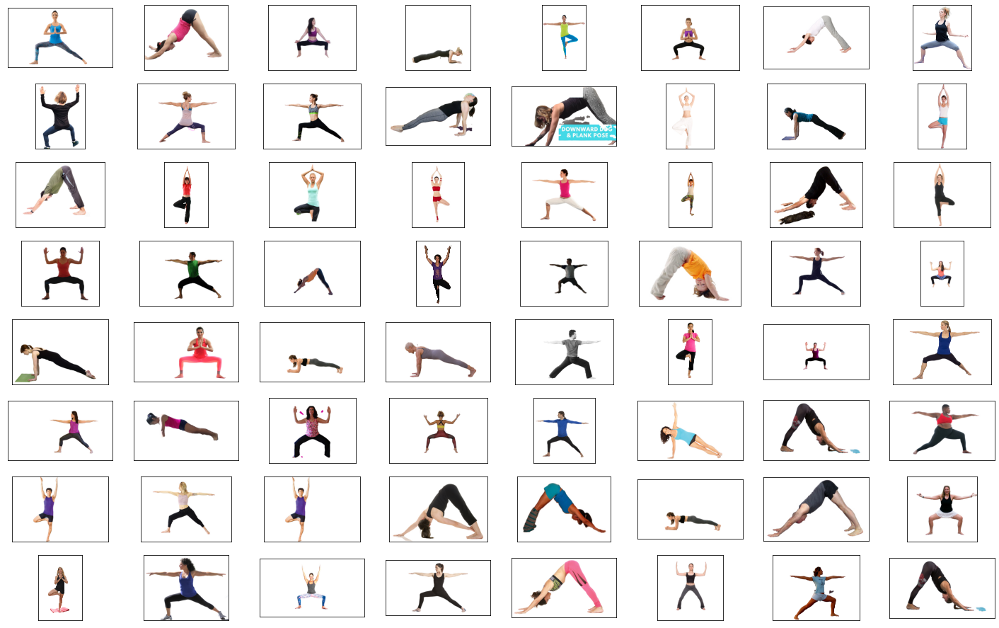

In [ ]:
img_base_path = "generative-yoga-images/all-poses/all-poses"
images=os.listdir("generative-yoga-images/all-poses/all-poses")
# choose 64 random images to display
images_to_display = random.choices(images, k=64)
# display the images
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(images_to_display):
    ax = fig.add_subplot(8, 8, ii + 1, xticks=[], yticks=[])
    
    img = Image.open(os.path.join(img_base_path, img))
    plt.imshow(img)

the following code is test code for cropping the images using the bounding boxes, I did not delete it because it clearly displays what is done: 

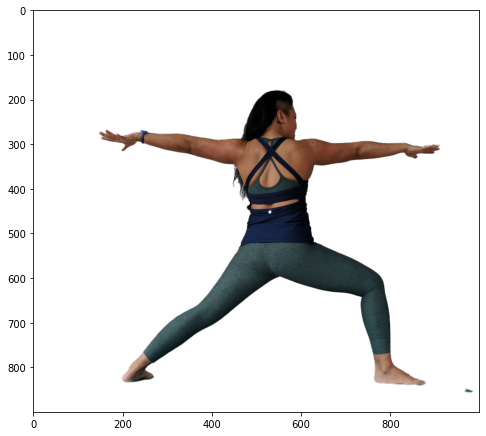

In [ ]:
# (test code) choose an image and display a bit bigger
image_name = 'warrior2 (10).jpg'
img = Image.open(os.path.join(img_base_path, image_name))

# display image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

In [ ]:
#(test code)
#image_name[:-4]

In [ ]:
# (test code) finding annotation of this particular image
# image name == annotation name

annotation_folders = os.listdir('generative-yoga-images/annotations')
breed_folder = [x for x in annotation_folders if image_name.split(' ')[0] in x]
assert len(breed_folder) == 1, "Multiple Folders Found"

breed_folder = breed_folder[0]
print("Image Folder: ", breed_folder)
annotation_path = os.path.join('generative-yoga-images/annotations', breed_folder, image_name[:-4] +'.xml')
print("Annotation Path: ", annotation_path)


Image Folder:  warrior2
Annotation Path:  generative-yoga-images/annotations/warrior2/warrior2 (10).xml


In [ ]:
#(test code) display the annotation of the image
!cat '/content/generative-yoga-images/annotations/warrior2/warrior2 (10).xml'

<annotation>
	<folder>warrior2</folder>
	<filename>warrior2 (10).jpg</filename>
	<path>/warrior2/warrior2 (10).jpg</path>
	<source>
		<database>Unspecified</database>
	</source>
	<size>
		<width>1000</width>
		<height>900</height>
		<depth>3</depth>
	</size>
	<object>
		<name>warrior2</name>
		<pose>Unspecified</pose>
		<truncated>Unspecified</truncated>
		<difficult>Unspecified</difficult>
		<bndbox>
			<xmin>134</xmin>
			<ymin>162</ymin>
			<xmax>911</xmax>
			<ymax>861</ymax>
		</bndbox>
	</object>
</annotation>

Bounding Box:  (134, 162, 911, 861)


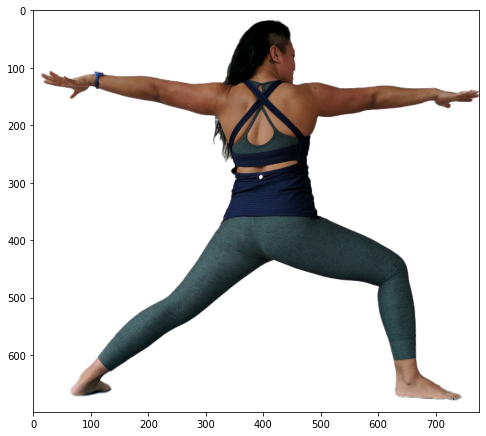

In [ ]:
# (test code) crop the image using the bounding box
tree = ET.parse(annotation_path)
root = tree.getroot()
objects = root.findall('object')
for obj in objects:
    bndbox = obj.find('bndbox')
    xmin = int(bndbox.find('xmin').text)
    ymin = int(bndbox.find('ymin').text)
    xmax = int(bndbox.find('xmax').text)
    ymax = int(bndbox.find('ymax').text)
bbox = (xmin, ymin, xmax, ymax)
print("Bounding Box: ", bbox)

# crop image
img = img.crop(bbox)

# display cropped image
fig = plt.figure(figsize=(8, 12))
plt.imshow(img)

As the test code works, it is now applied crop the other images as well. Furthermore the images are reshaped to the right format to input in the model afterwards: 

In [ ]:
#!ls all-poses/all-poses

In [ ]:
#now this is applied to crop all of the images
root_images = "generative-yoga-images/all-poses/all-poses/"
root_annots = "generative-yoga-images/annotations/"
INPUT_DATA_DIR = "generative-yoga-images/all-poses/all-poses/"
IMG_DIR = "generated-images"
ComputeLB = False 
PosesOnly = True

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000


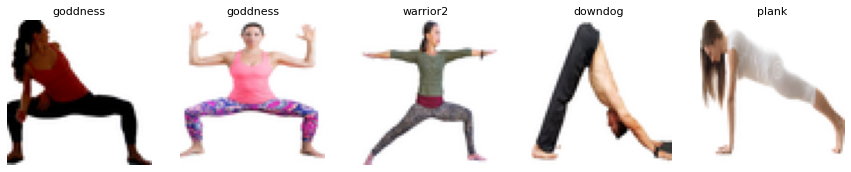

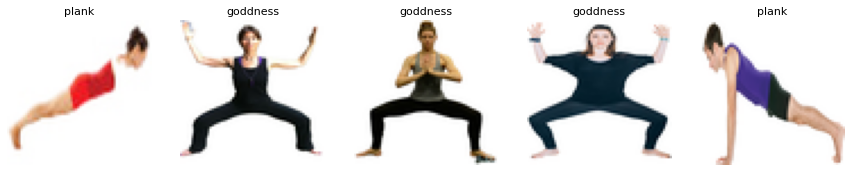

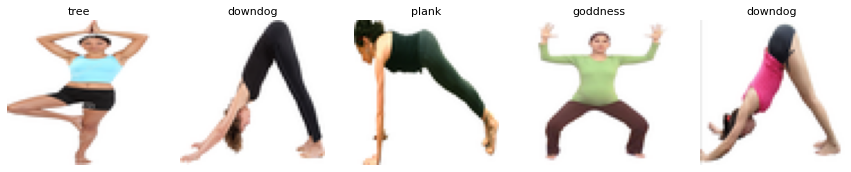

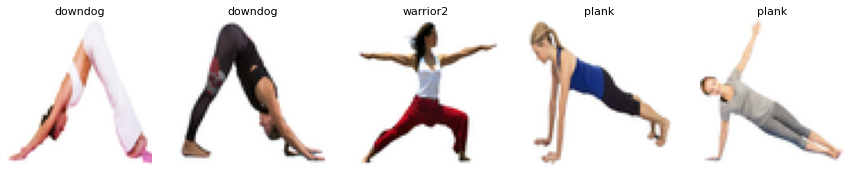

In [ ]:
ImageFile.LOAD_TRUNCATED_IMAGES = True
ROOT = 'generative-yoga-images/'
IMAGES = os.listdir(ROOT + 'all-poses/all-poses/')
#poses = os.listdir(ROOT + 'annotations/') 
poses=['tree', 'plank', 'goddness', 'downdog', 'warrior2'] 

idxIn = 0; namesIn = []
imagesIn = np.zeros((1038,64,64,3))

# crop the images with the bounding boxes to get only the yoga poses
if PosesOnly:
    for pose in poses:
        for POSE in os.listdir(ROOT+'annotations/'+pose):
            try: img = Image.open(ROOT+'all-poses/all-poses/'+POSE[:-4]+'.jpg').convert('RGB') 
            except: continue           
            tree = ET.parse(ROOT+'annotations/'+pose+'/'+POSE)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                bbox = (xmin, ymin, xmax, ymax)
                img2 = img.crop(bbox)
                img2 = img2.resize((64,64), Image.ANTIALIAS) #resize the images to 64x64 (the input format for the model)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                if idxIn%50==0: print(idxIn)
                namesIn.append(pose)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]

# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,20)
for k in range(4):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not PosesOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]],fontsize=11)
        plt.imshow(img)
    plt.show()

## 2. Modeling

The model that is being used for generating new yoga poses is DCGAN. The architecture of the model is show in the image below: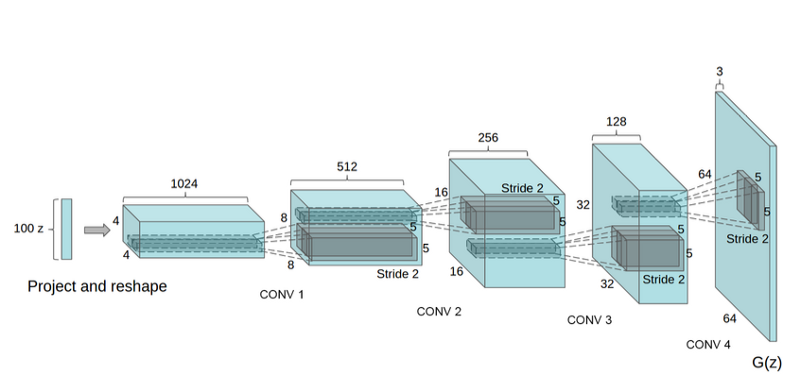

### **Generator**

In [ ]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        
        # 4x4x512
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 4x4x512 -> 8x8x256
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 8x8x256 -> 16x16x128
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
                # 16x16x128 -> 32x32x64
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        

        # 32x32x64 -> 64x64x32
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=32,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 64x64x32 -> 64x64x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out


### **Discriminator**

In [ ]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 64x64x3 -> 32x32x32
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 32x32x32 -> 16x16x64
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 16x16x64 -> 8x8x128
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
         # 8x8x128 -> 8x8x256
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 8x8x256 -> 4x4x512
        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

### **Loss and Optimizer**

In [ ]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [ ]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [ ]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

### **Utils**

In [ ]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()


In [ ]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [ ]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [ ]:
def generate (sess, input_z, out_channel_dim):
    print (">> Generating 1k images ...")
    for i in tqdm(range(100)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        for j in range(len(imgs)):
            imsave(os.path.join(IMG_DIR, f'pose_{i}_{j}.png'), imgs[j])

In [ ]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [ ]:
  def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

## 3. Training

Now the model is being trained.

In [ ]:
!mkdir images
!ls

mkdir: cannot create directory ‘images’: File exists
generated-images  generative-yoga-images  images  sample_data


In [ ]:
# definition for training the model using the hyperparameters given as input
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
  
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()

### **hyperparameters**

Hyperparameters are chosen by testing some different values.

In [ ]:
IMAGE_SIZE = 64
NOISE_SIZE = 100 
LR_D = 0.0005  #learning rate discriminator
LR_G = 2e-4    #learning rate generator
BATCH_SIZE = 25 #eerst 64
EPOCHS = 100 #eerst 100
BETA1_G = 0.5  #bet1 value for adam optimizer in generator
BETA1_D = 0.5  #bet1 value for adam optimizer in discriminator
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

### **training loop**

In [ ]:
import tensorflow as tf

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

>> Start training...


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1692: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/convolutional.py:1294: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  warnings.warn('`tf.layers.conv2d_transpose` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/legacy_tf_layers/normalization.py:308: UserWarning: `tf.layers.batch_

Epoch 1/100 
Duration: 180.47945 
D Loss: 1.82336 
G Loss: 6.19450


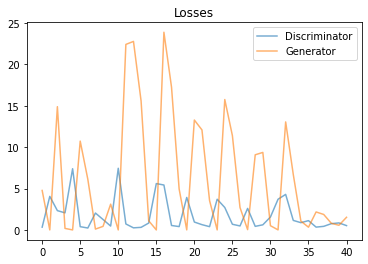

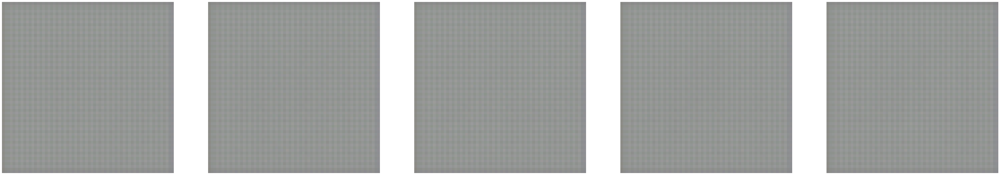

Epoch 2/100 
Duration: 177.51153 
D Loss: 0.56916 
G Loss: 1.76684


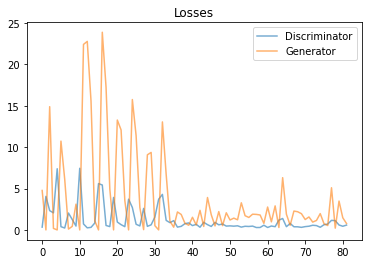

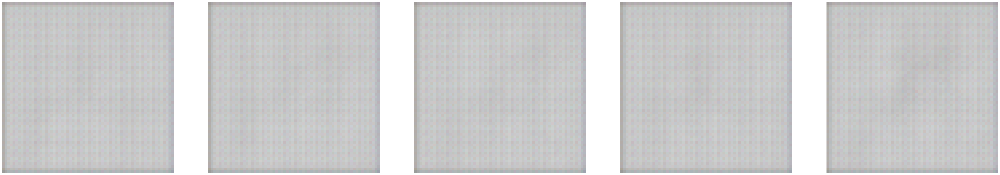

Epoch 3/100 
Duration: 178.12024 
D Loss: 0.65538 
G Loss: 1.98470


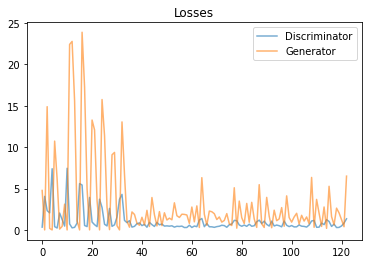

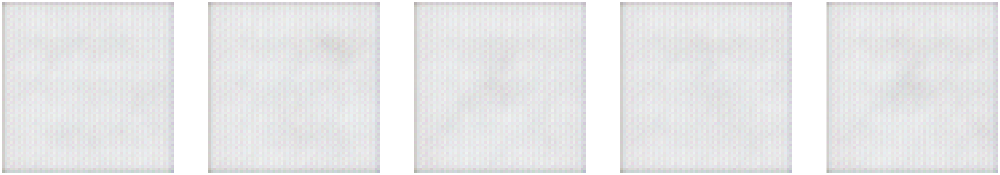

Epoch 4/100 
Duration: 180.50608 
D Loss: 0.56767 
G Loss: 1.83946


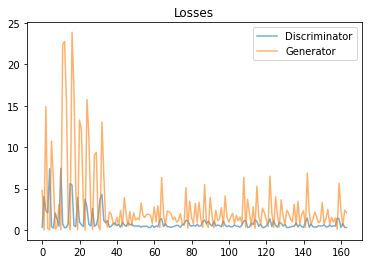

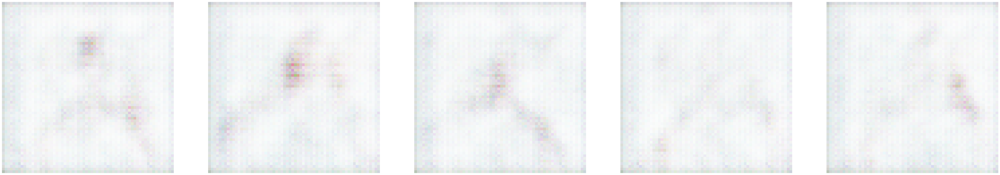

Epoch 5/100 
Duration: 177.47272 
D Loss: 0.54571 
G Loss: 1.57576


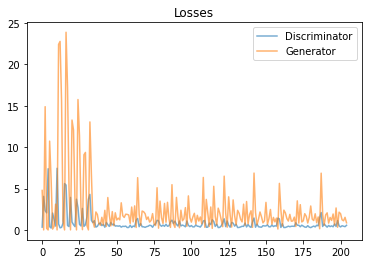

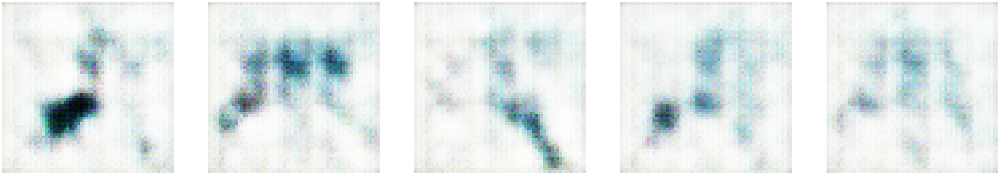

Epoch 6/100 
Duration: 177.03113 
D Loss: 0.57582 
G Loss: 1.53122


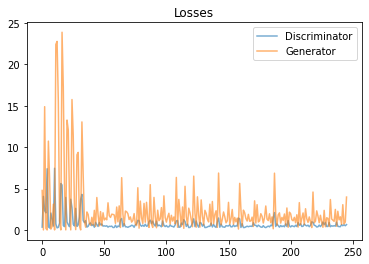

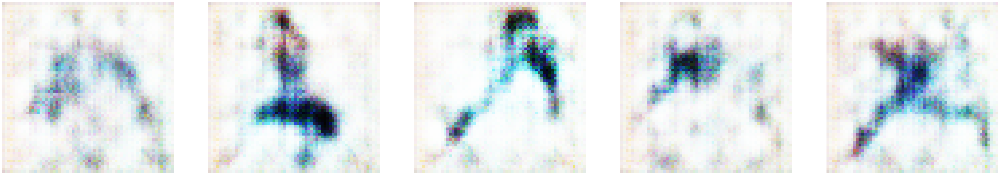

Epoch 7/100 
Duration: 179.93303 
D Loss: 0.50991 
G Loss: 1.56440


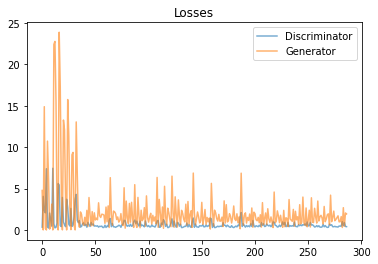

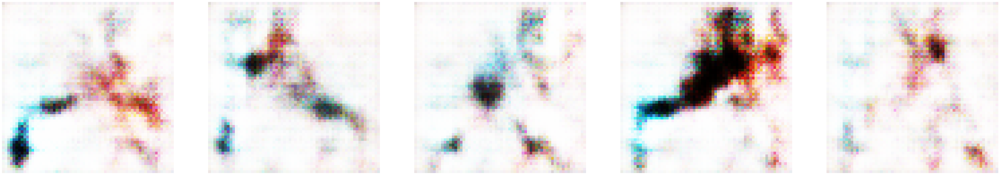

Epoch 8/100 
Duration: 180.95939 
D Loss: 0.49664 
G Loss: 1.70764


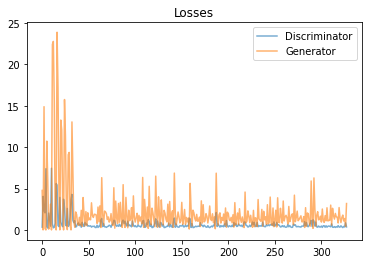

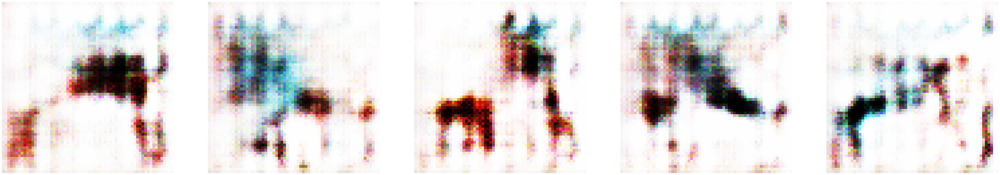

Epoch 9/100 
Duration: 180.71864 
D Loss: 0.45648 
G Loss: 1.79135


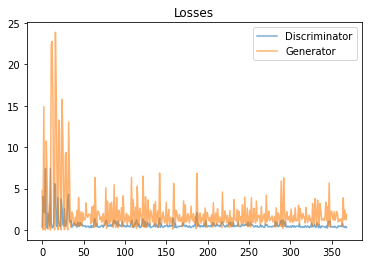

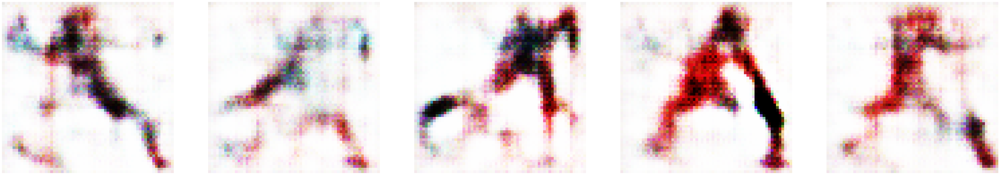

Epoch 10/100 
Duration: 178.08882 
D Loss: 0.47527 
G Loss: 1.96747


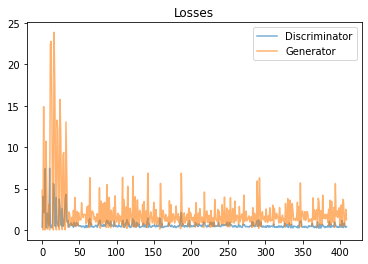

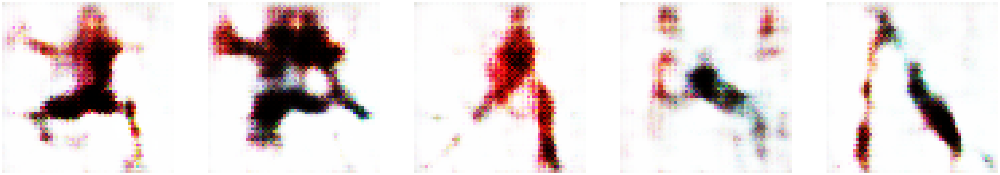

Epoch 11/100 
Duration: 177.52056 
D Loss: 0.44889 
G Loss: 1.84682


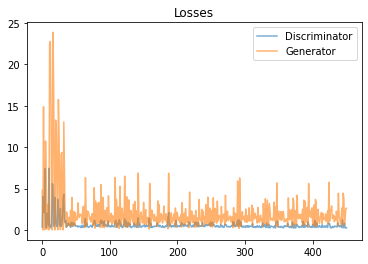

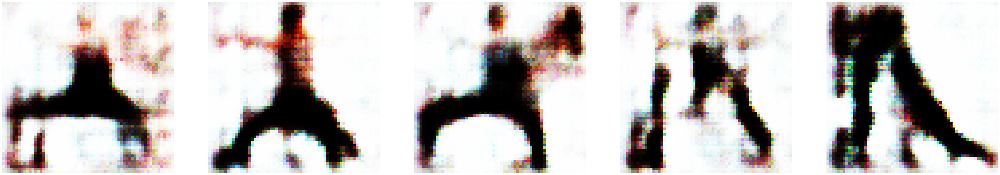

Epoch 12/100 
Duration: 180.32484 
D Loss: 0.45217 
G Loss: 1.81284


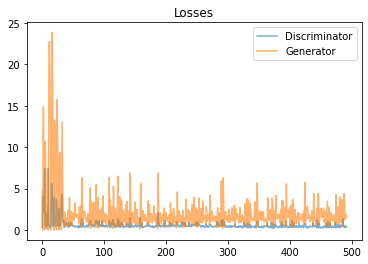

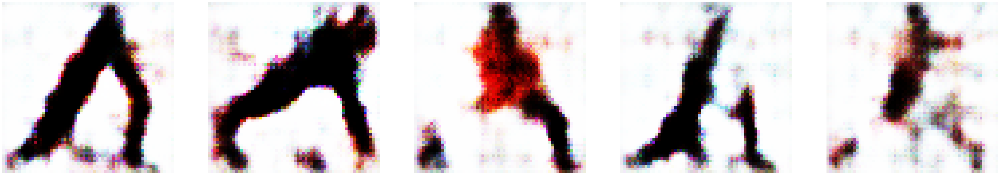

Epoch 13/100 
Duration: 175.94590 
D Loss: 0.46861 
G Loss: 1.83786


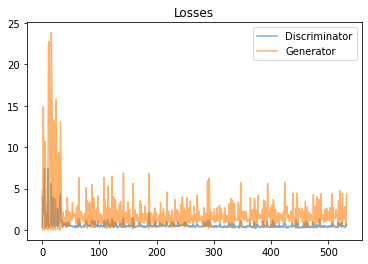

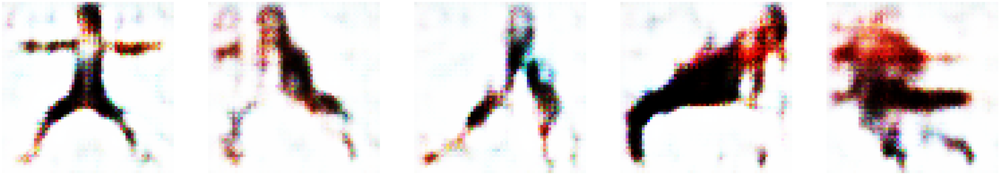

Epoch 14/100 
Duration: 183.36237 
D Loss: 0.45464 
G Loss: 1.74062


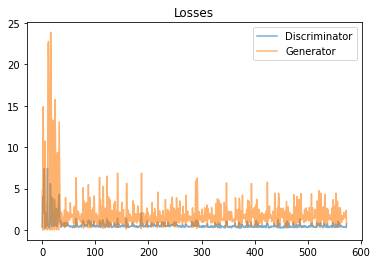

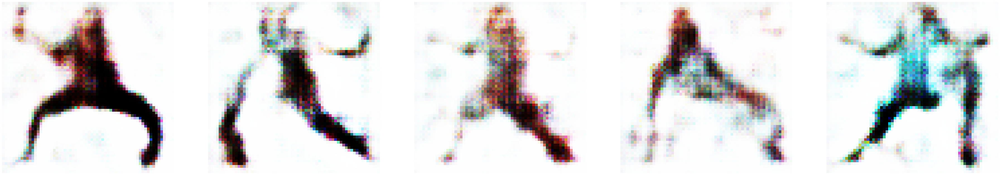

Epoch 15/100 
Duration: 181.68739 
D Loss: 0.45714 
G Loss: 1.84488


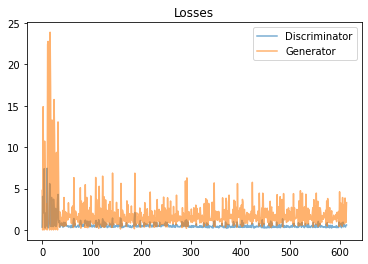

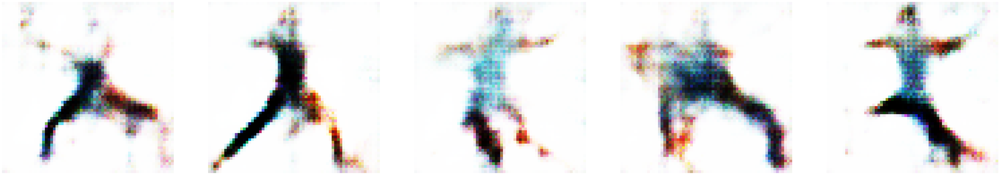

Epoch 16/100 
Duration: 179.06322 
D Loss: 0.45491 
G Loss: 1.78293


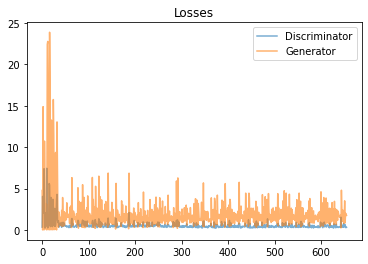

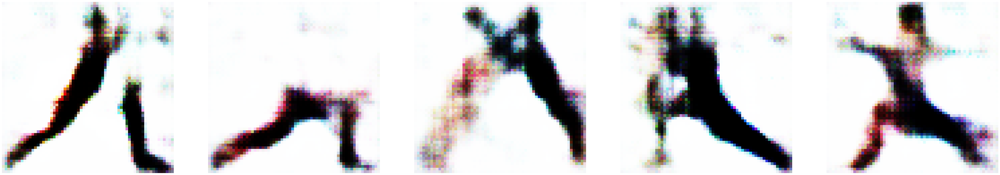

Epoch 17/100 
Duration: 179.19532 
D Loss: 0.49268 
G Loss: 1.82744


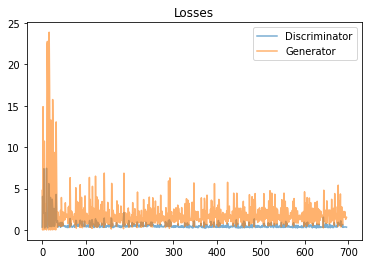

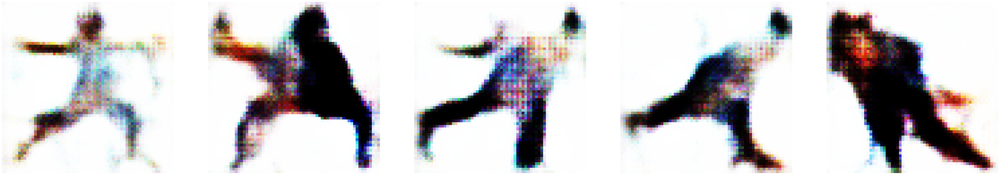

Epoch 18/100 
Duration: 177.90136 
D Loss: 0.37478 
G Loss: 1.73798


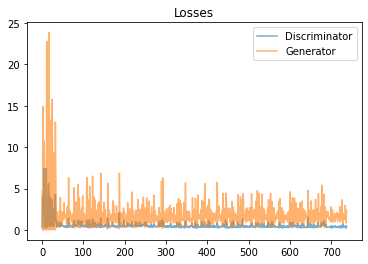

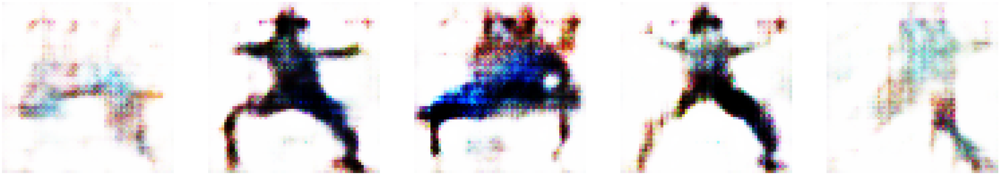

Epoch 19/100 
Duration: 181.22066 
D Loss: 0.49393 
G Loss: 2.05026


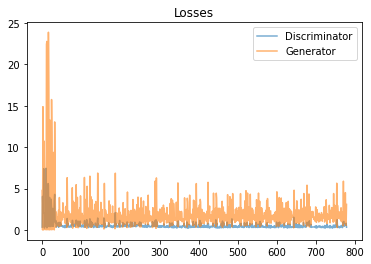

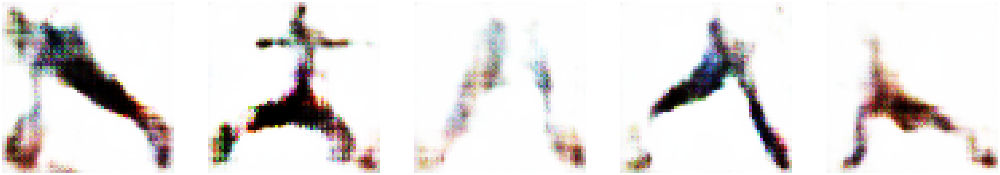

Epoch 20/100 
Duration: 181.29447 
D Loss: 0.43782 
G Loss: 1.83717


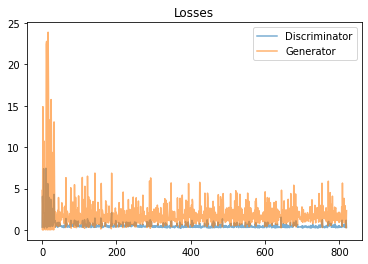

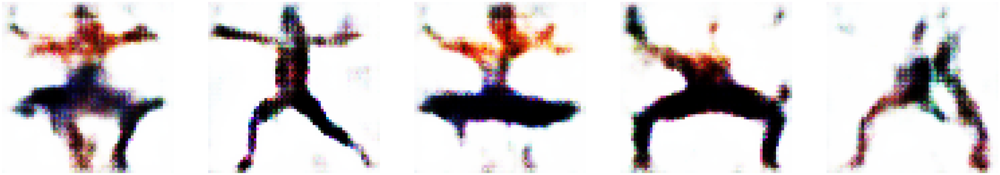

Epoch 21/100 
Duration: 180.85119 
D Loss: 0.40982 
G Loss: 1.74455


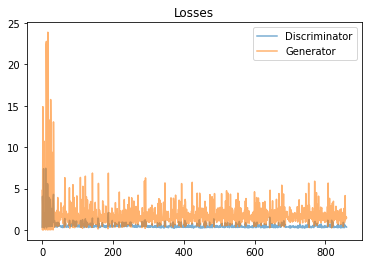

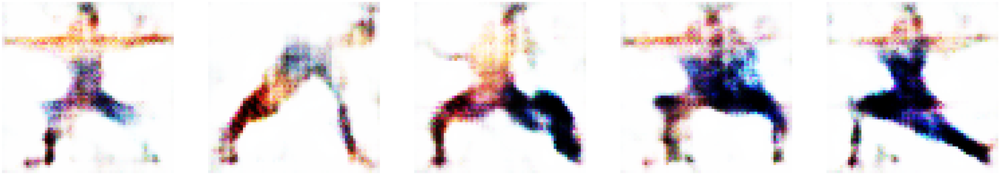

Epoch 22/100 
Duration: 178.31354 
D Loss: 0.47156 
G Loss: 2.00887


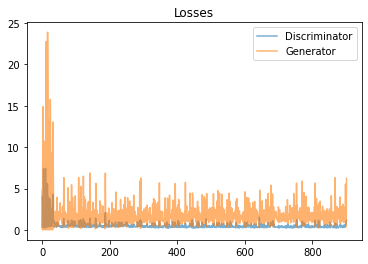

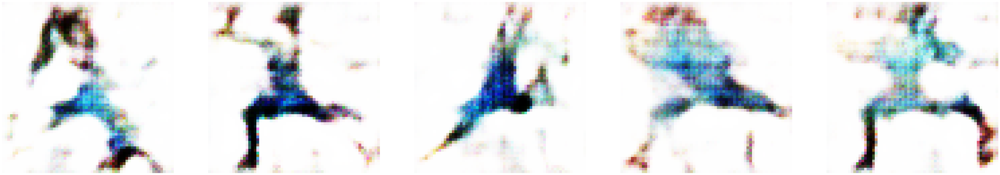

Epoch 23/100 
Duration: 178.61870 
D Loss: 0.43033 
G Loss: 1.79691


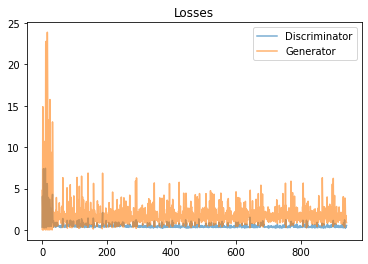

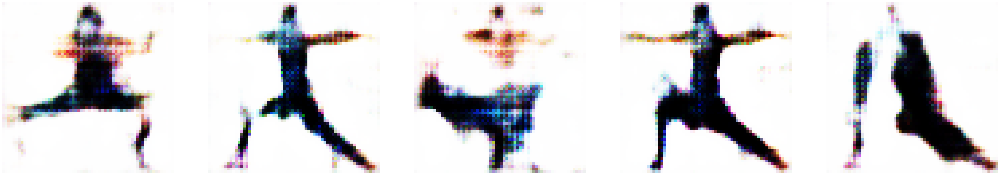

Epoch 24/100 
Duration: 182.13314 
D Loss: 0.42793 
G Loss: 1.88862


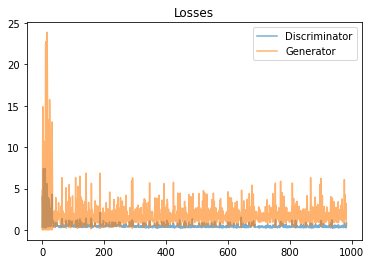

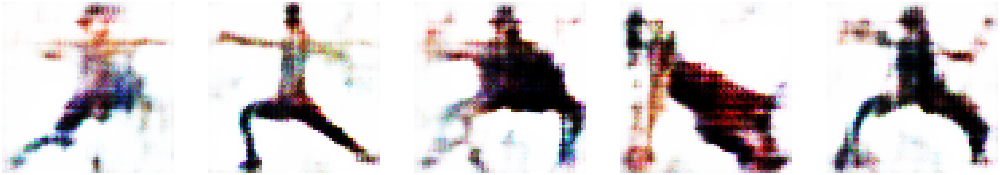

Epoch 25/100 
Duration: 181.78364 
D Loss: 0.46417 
G Loss: 1.79800


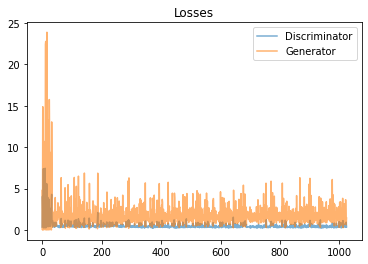

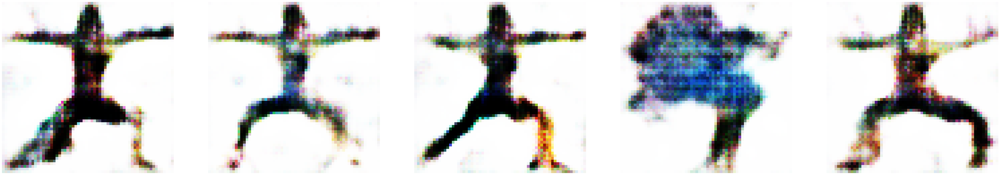

Epoch 26/100 
Duration: 176.70059 
D Loss: 0.38185 
G Loss: 1.89613


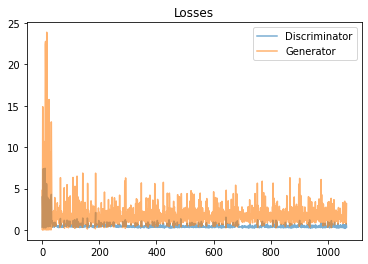

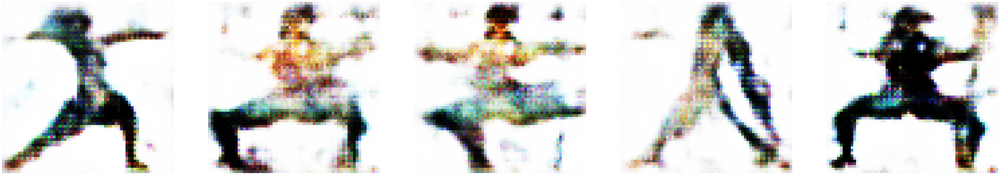

Epoch 27/100 
Duration: 177.31804 
D Loss: 0.42199 
G Loss: 1.86567


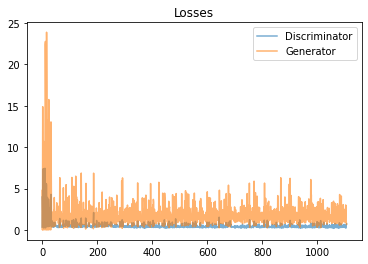

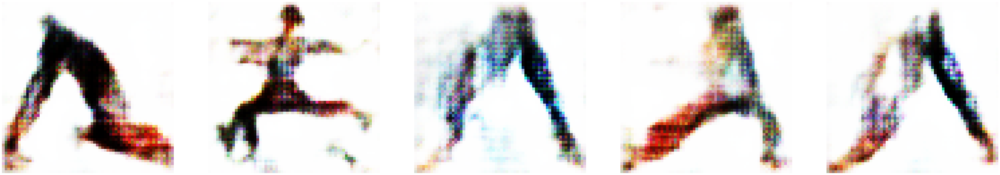

Epoch 28/100 
Duration: 177.36648 
D Loss: 0.37566 
G Loss: 1.83785


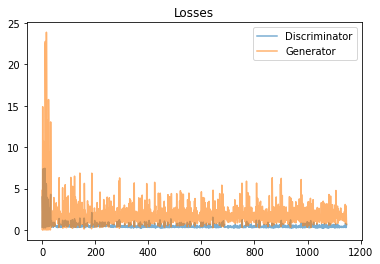

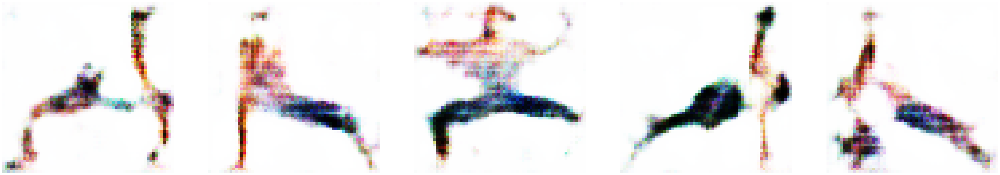

Epoch 29/100 
Duration: 178.36143 
D Loss: 0.48603 
G Loss: 1.93281


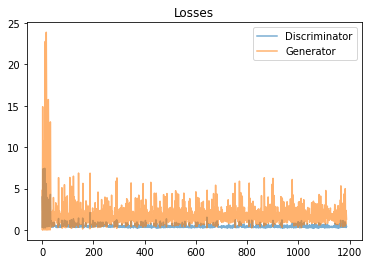

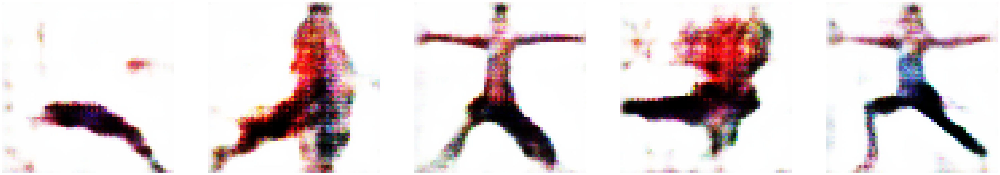

Epoch 30/100 
Duration: 177.66592 
D Loss: 0.47425 
G Loss: 1.91558


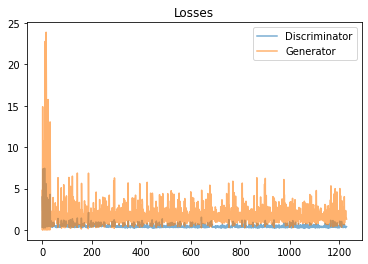

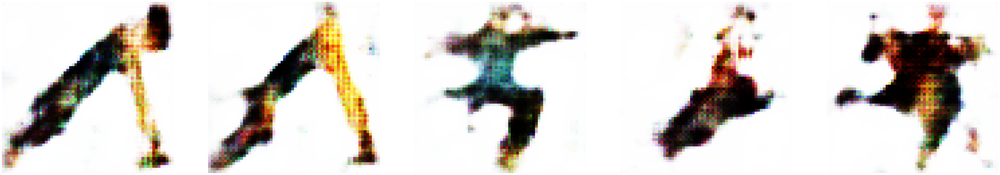

Epoch 31/100 
Duration: 181.99419 
D Loss: 0.39042 
G Loss: 1.75941


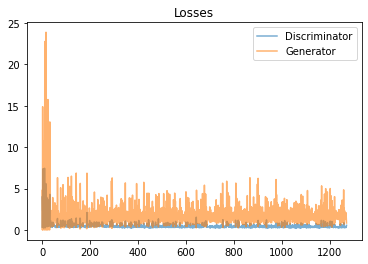

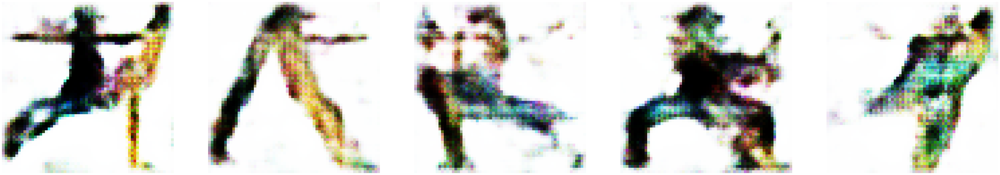

Epoch 32/100 
Duration: 180.72046 
D Loss: 0.39420 
G Loss: 1.93455


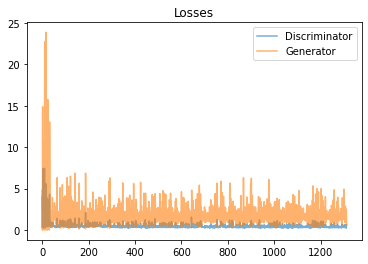

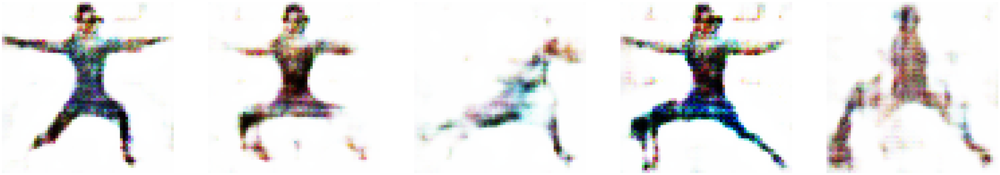

Epoch 33/100 
Duration: 180.63498 
D Loss: 0.45475 
G Loss: 1.87902


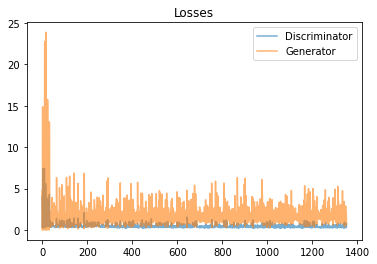

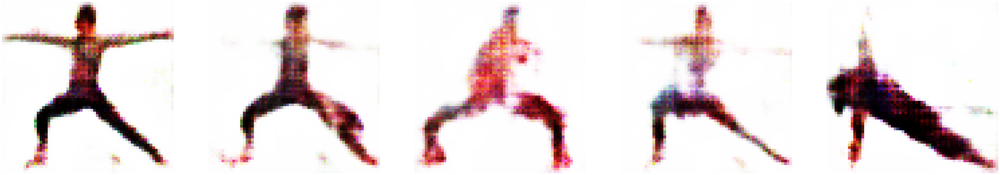

Epoch 34/100 
Duration: 181.10220 
D Loss: 0.39178 
G Loss: 1.71282


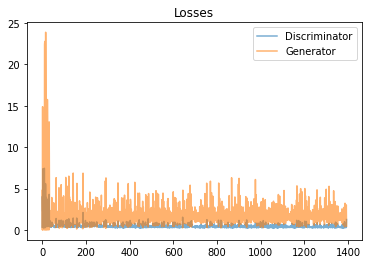

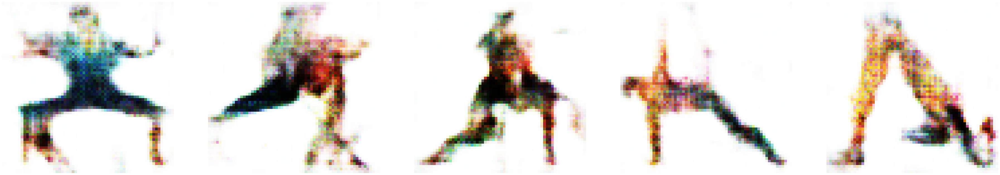

Epoch 35/100 
Duration: 180.29408 
D Loss: 0.48911 
G Loss: 1.94627


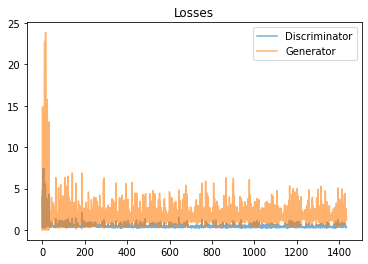

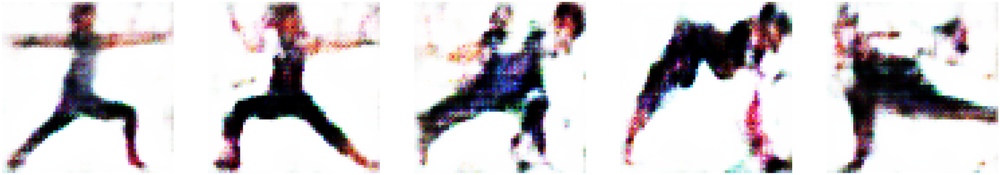

Epoch 36/100 
Duration: 178.62866 
D Loss: 0.41218 
G Loss: 1.81693


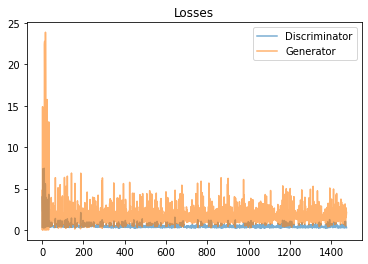

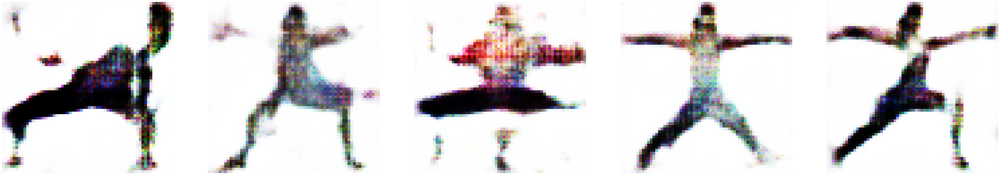

Epoch 37/100 
Duration: 178.22039 
D Loss: 0.34097 
G Loss: 1.80470


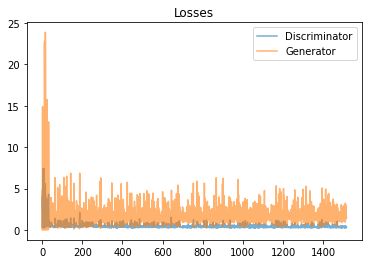

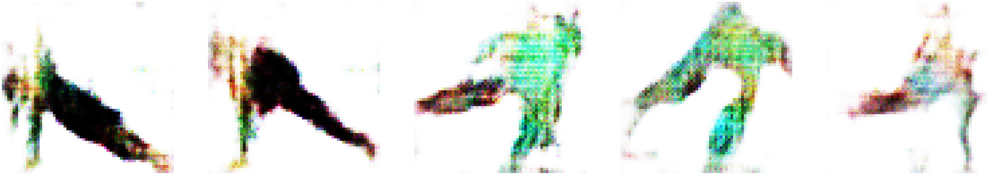

Epoch 38/100 
Duration: 178.94809 
D Loss: 0.33002 
G Loss: 1.94205


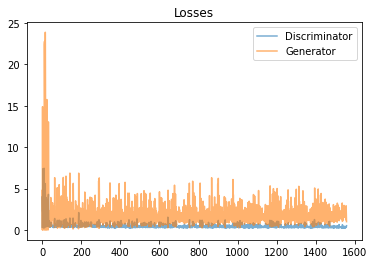

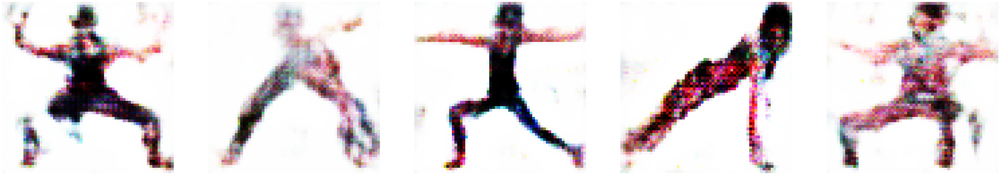

Epoch 39/100 
Duration: 178.80996 
D Loss: 0.42781 
G Loss: 2.03221


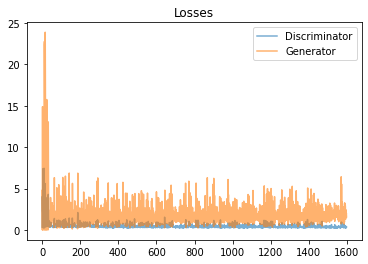

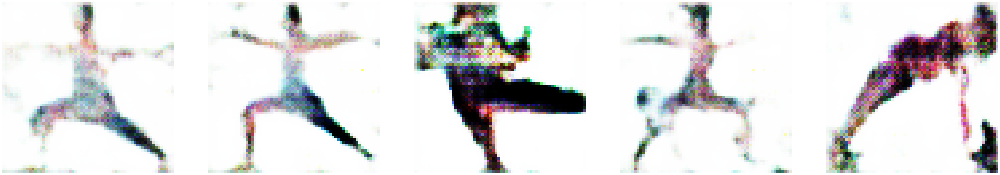

Epoch 40/100 
Duration: 179.07497 
D Loss: 0.41481 
G Loss: 1.82340


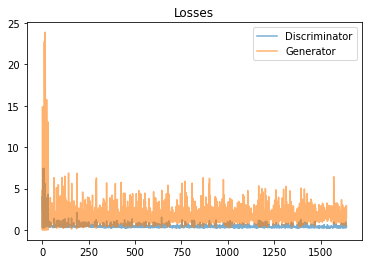

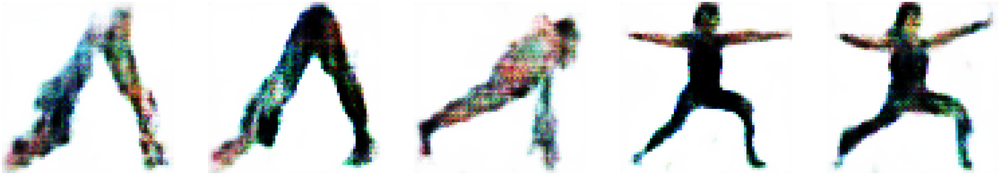

Epoch 41/100 
Duration: 181.48569 
D Loss: 0.36661 
G Loss: 2.03322


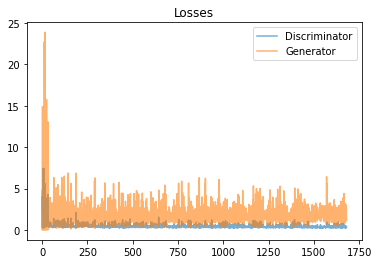

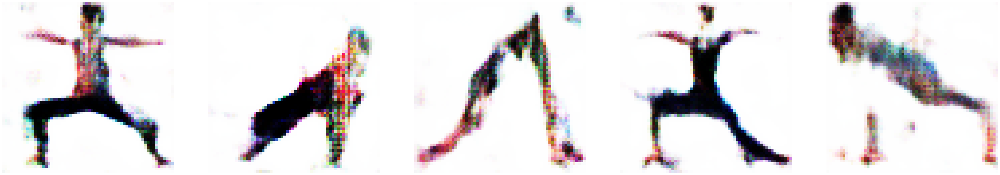

Epoch 42/100 
Duration: 180.72589 
D Loss: 0.35608 
G Loss: 1.90708


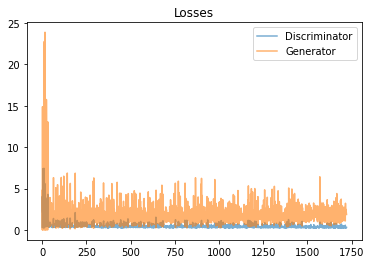

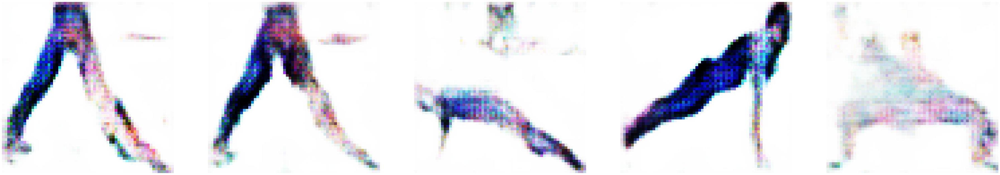

Epoch 43/100 
Duration: 179.13307 
D Loss: 0.40743 
G Loss: 1.83389


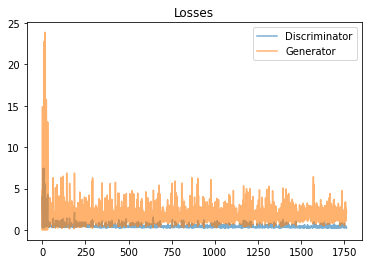

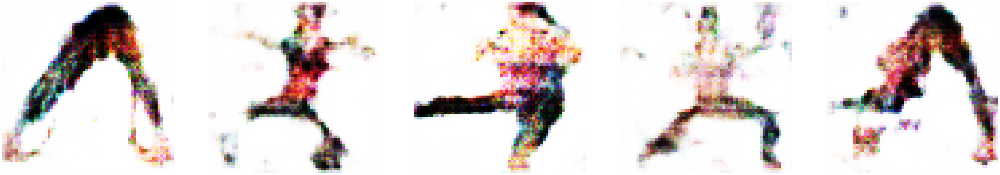

Epoch 44/100 
Duration: 177.05105 
D Loss: 0.44736 
G Loss: 2.06516


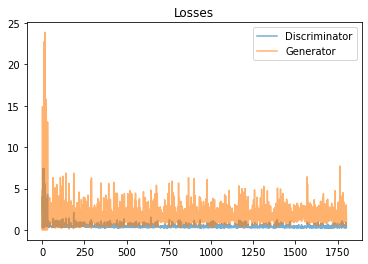

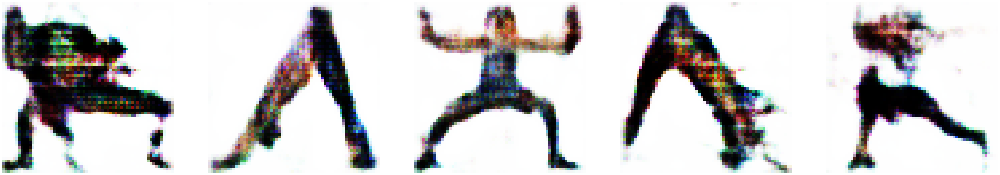

Epoch 45/100 
Duration: 176.07401 
D Loss: 0.38916 
G Loss: 1.92509


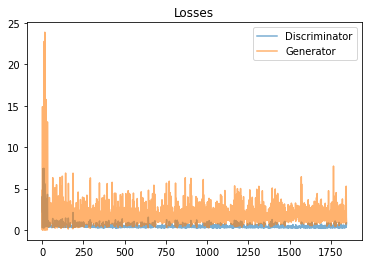

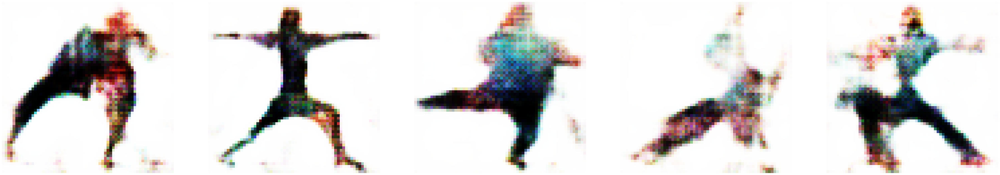

Epoch 46/100 
Duration: 175.87114 
D Loss: 0.42257 
G Loss: 2.15653


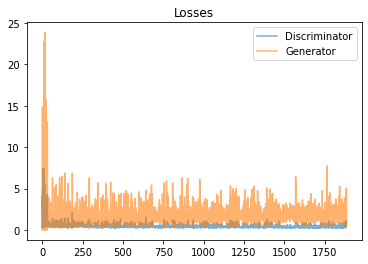

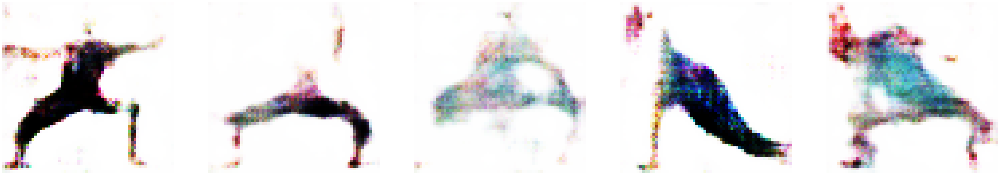

Epoch 47/100 
Duration: 173.74929 
D Loss: 0.41891 
G Loss: 2.02674


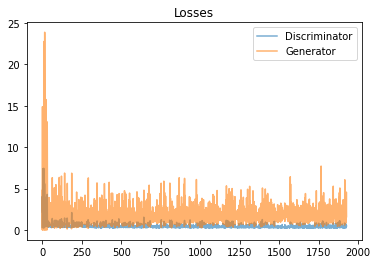

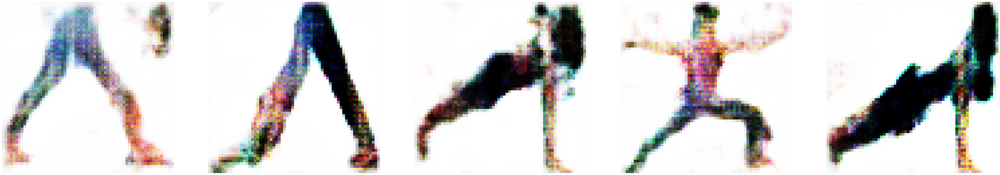

Epoch 48/100 
Duration: 175.87817 
D Loss: 0.38424 
G Loss: 1.95105


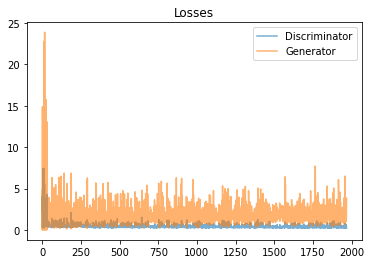

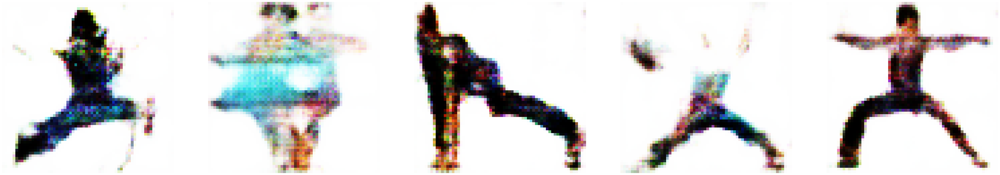

Epoch 49/100 
Duration: 177.80278 
D Loss: 0.32637 
G Loss: 1.87787


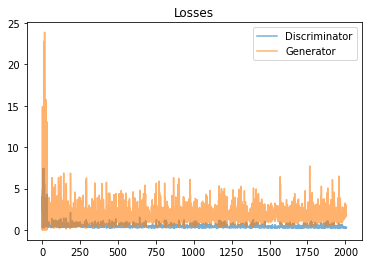

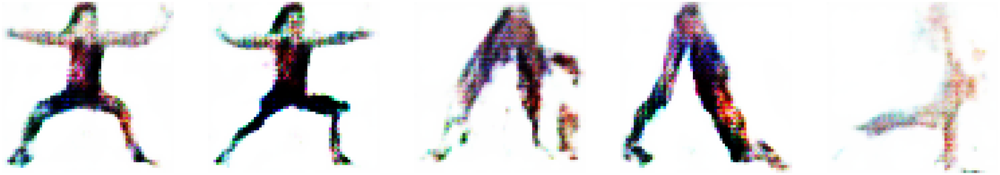

Epoch 50/100 
Duration: 180.83363 
D Loss: 0.50551 
G Loss: 2.25136


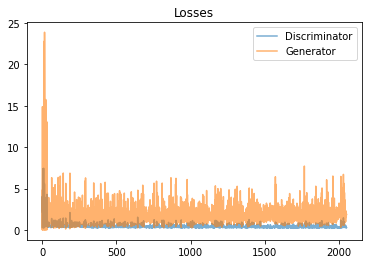

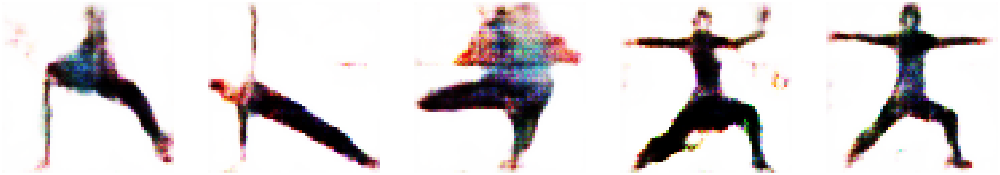

Epoch 51/100 
Duration: 179.62825 
D Loss: 0.35044 
G Loss: 1.90036


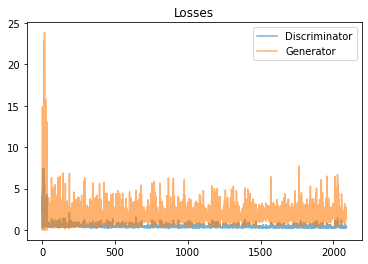

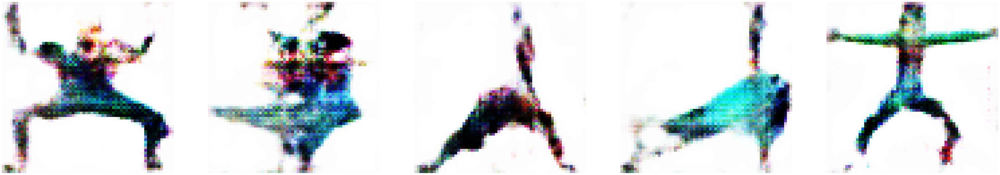

Epoch 52/100 
Duration: 180.70152 
D Loss: 0.34728 
G Loss: 1.93738


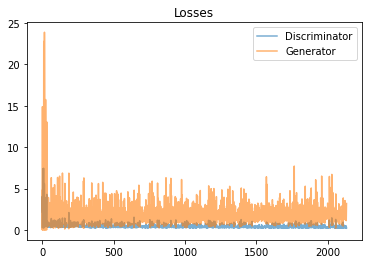

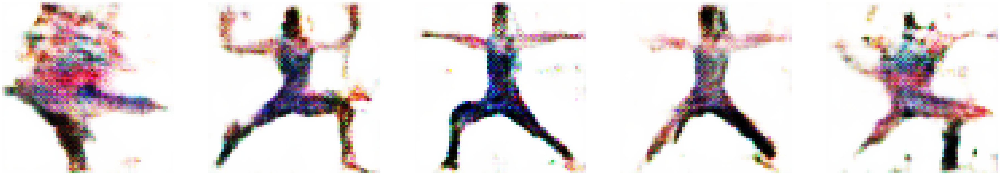

Epoch 53/100 
Duration: 179.16452 
D Loss: 0.30479 
G Loss: 1.99806


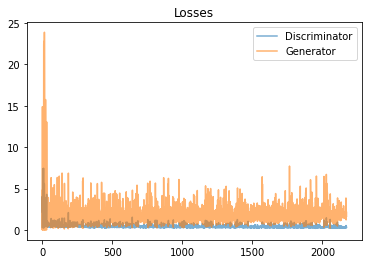

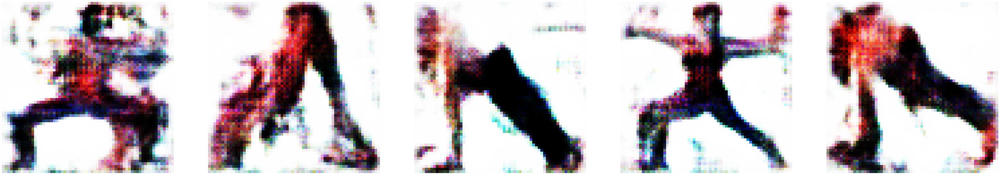

Epoch 54/100 
Duration: 176.19075 
D Loss: 0.39708 
G Loss: 2.07541


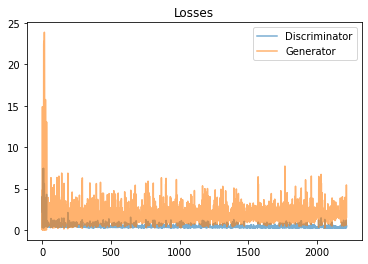

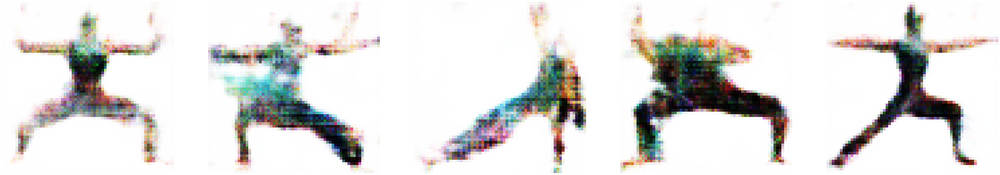

Epoch 55/100 
Duration: 175.36221 
D Loss: 0.34637 
G Loss: 2.14421


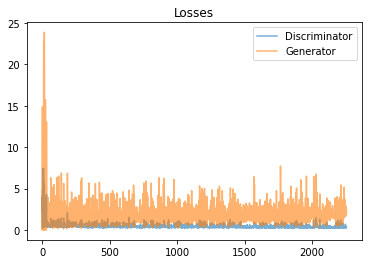

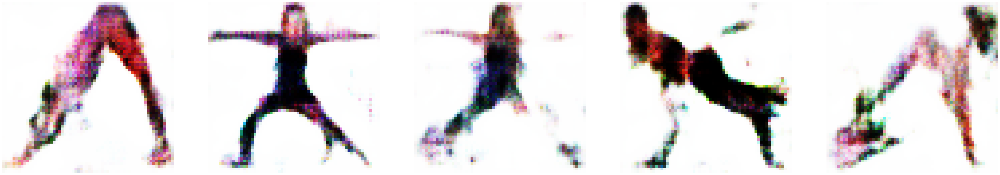

Epoch 56/100 
Duration: 175.06605 
D Loss: 0.29818 
G Loss: 2.37146


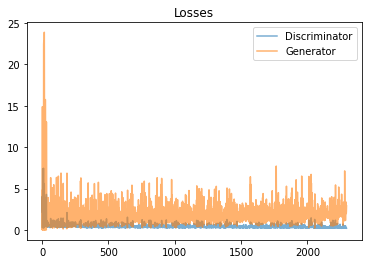

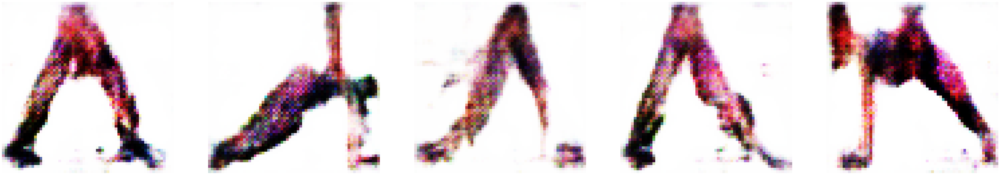

Epoch 57/100 
Duration: 176.25076 
D Loss: 0.29077 
G Loss: 2.14074


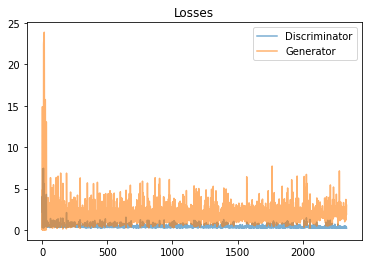

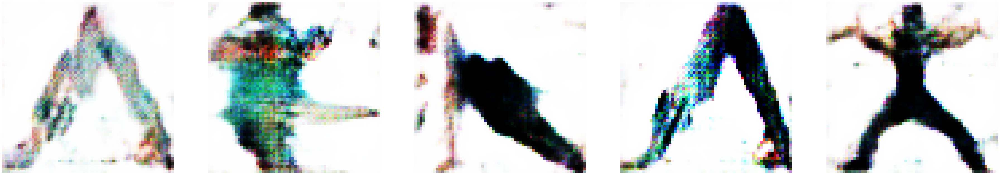

Epoch 58/100 
Duration: 175.60188 
D Loss: 0.46553 
G Loss: 2.27949


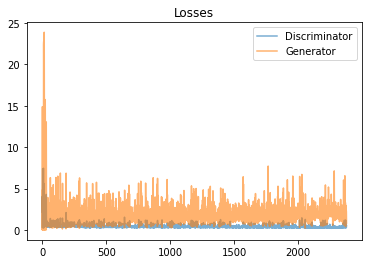

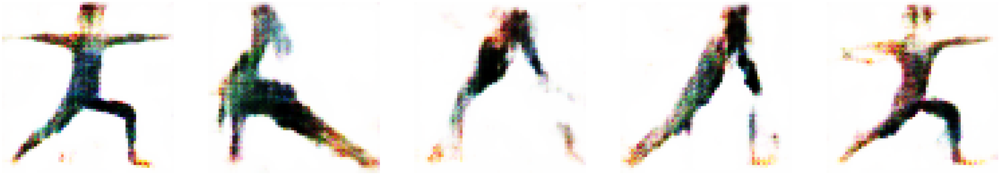

Epoch 59/100 
Duration: 177.33960 
D Loss: 0.36668 
G Loss: 2.13440


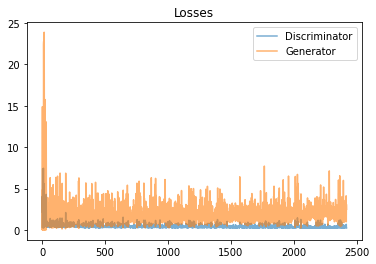

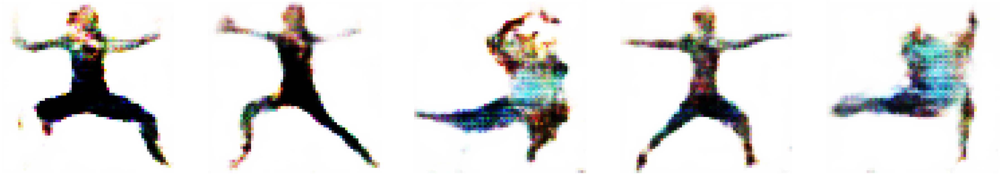

Epoch 60/100 
Duration: 182.76201 
D Loss: 0.36278 
G Loss: 2.14540


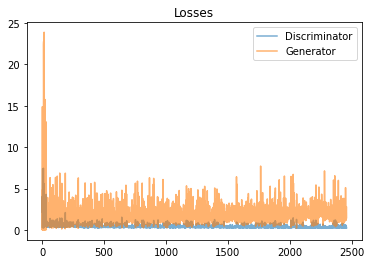

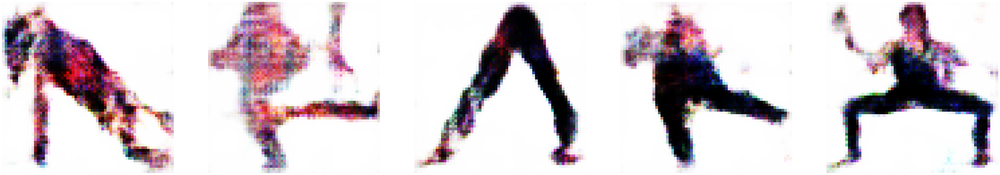

Epoch 61/100 
Duration: 182.60362 
D Loss: 0.32359 
G Loss: 1.98050


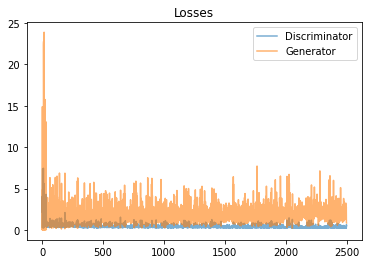

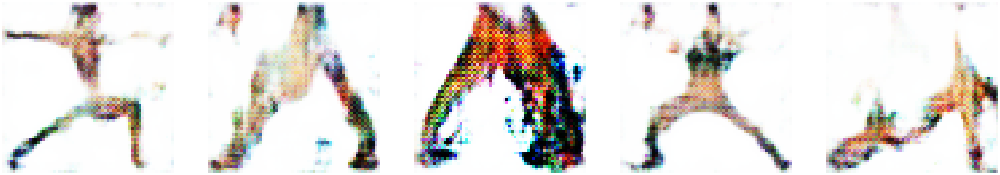

Epoch 62/100 
Duration: 181.93454 
D Loss: 0.28235 
G Loss: 2.19739


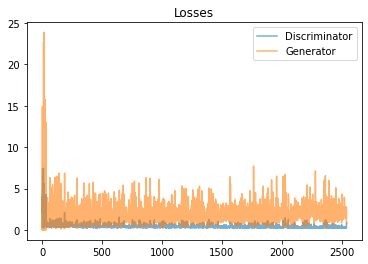

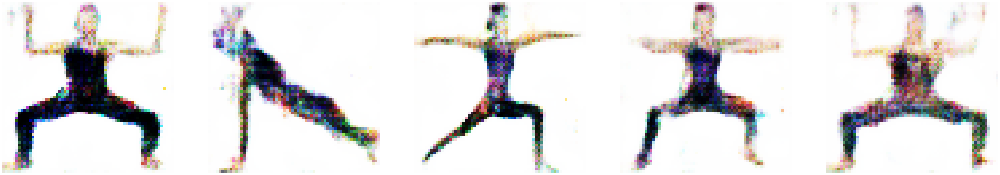

Epoch 63/100 
Duration: 180.70951 
D Loss: 0.30621 
G Loss: 2.41828


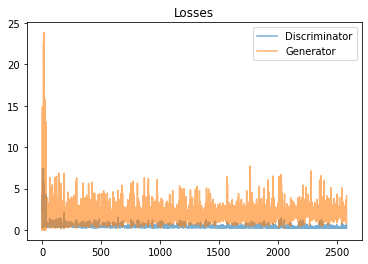

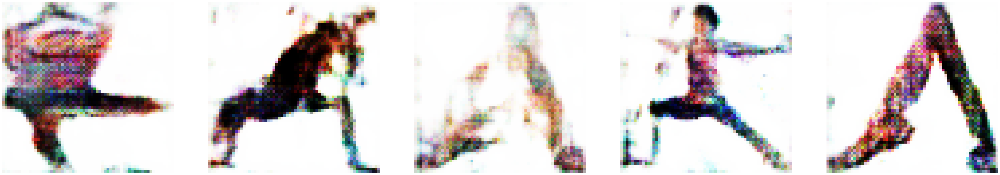

Epoch 64/100 
Duration: 178.87676 
D Loss: 0.30181 
G Loss: 2.24109


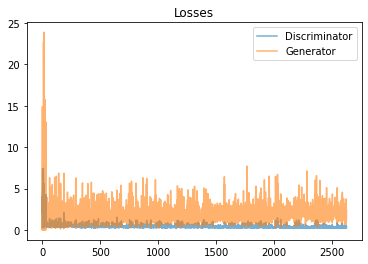

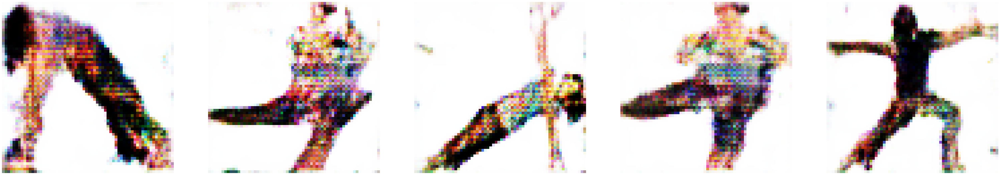

Epoch 65/100 
Duration: 176.63213 
D Loss: 0.29906 
G Loss: 2.24699


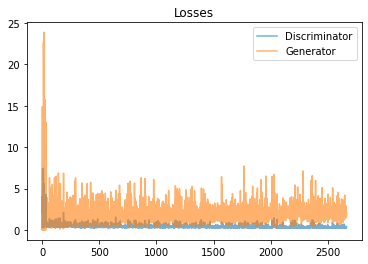

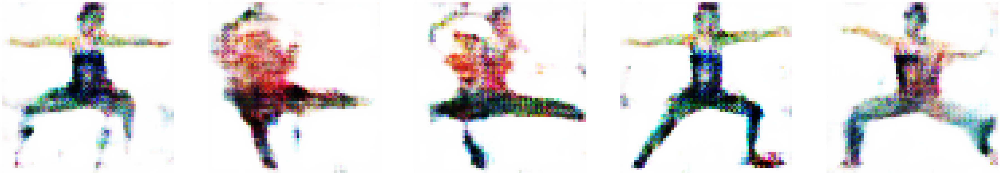

Epoch 66/100 
Duration: 174.47876 
D Loss: 0.46467 
G Loss: 2.56737


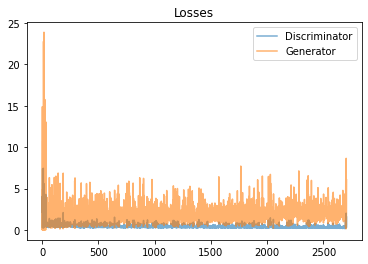

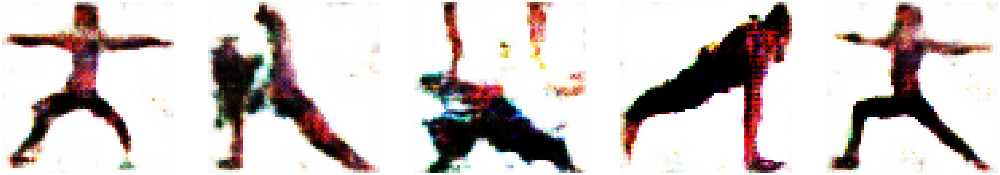

Epoch 67/100 
Duration: 174.68714 
D Loss: 0.46405 
G Loss: 2.03213


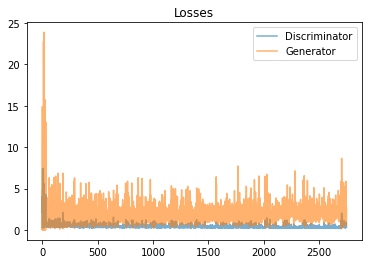

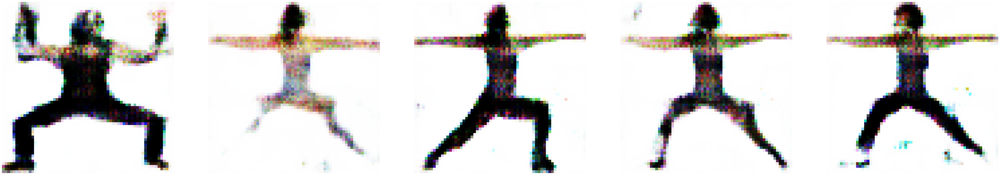

Epoch 68/100 
Duration: 181.36461 
D Loss: 0.33611 
G Loss: 2.08812


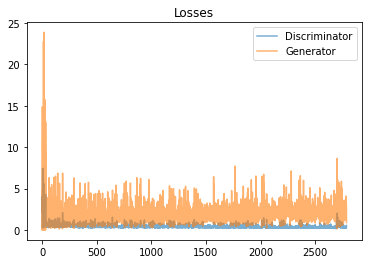

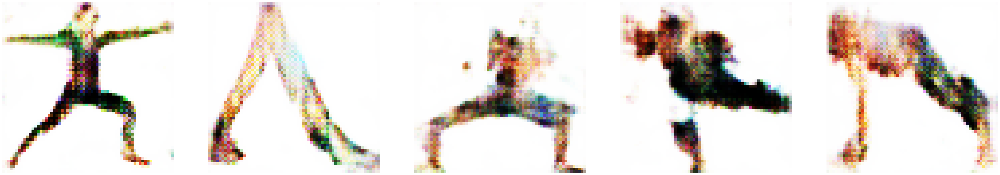

Epoch 69/100 
Duration: 181.39755 
D Loss: 0.29325 
G Loss: 2.15335


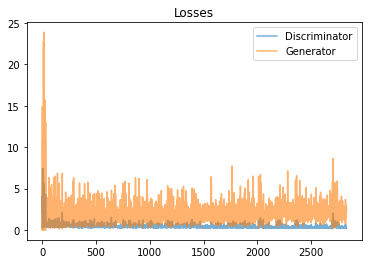

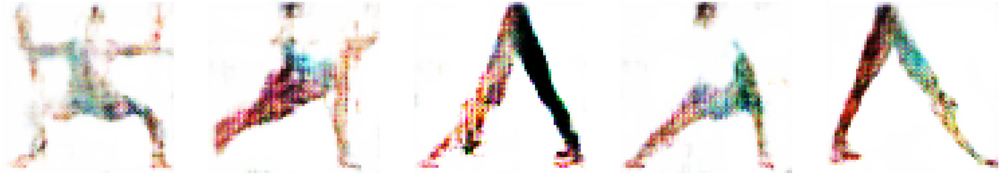

Epoch 70/100 
Duration: 182.60271 
D Loss: 0.27803 
G Loss: 2.26225


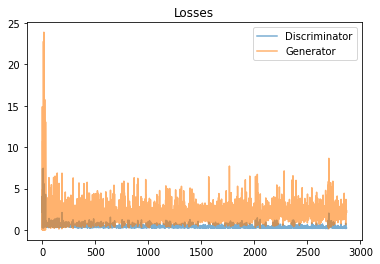

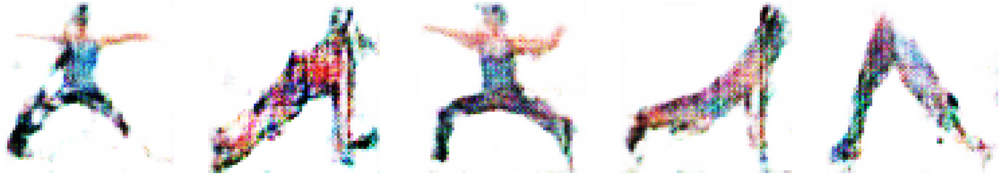

Epoch 71/100 
Duration: 177.32492 
D Loss: 0.26955 
G Loss: 2.23566


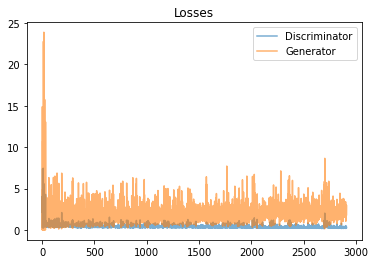

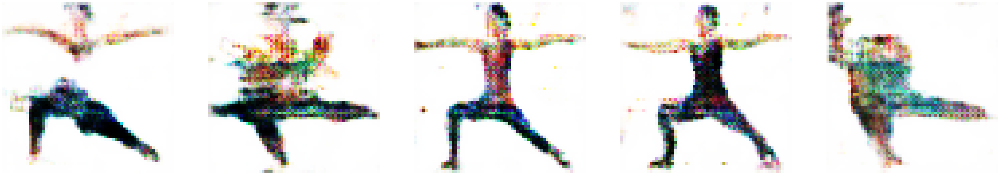

Epoch 72/100 
Duration: 178.77780 
D Loss: 0.26067 
G Loss: 2.58363


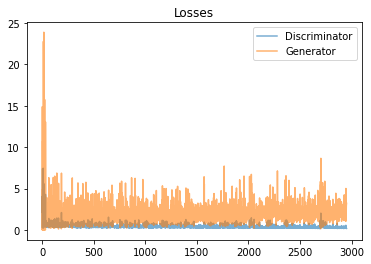

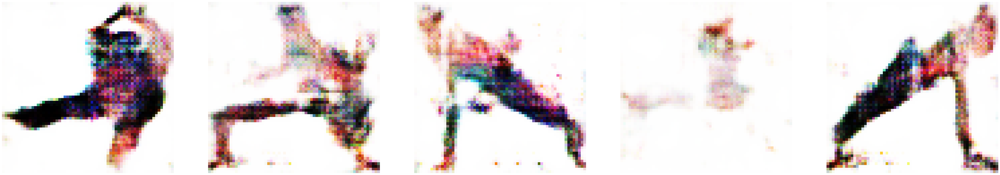

Epoch 73/100 
Duration: 175.59644 
D Loss: 0.28287 
G Loss: 2.43284


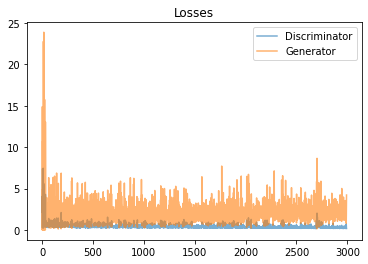

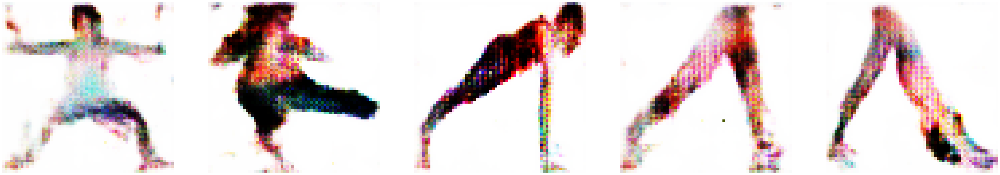

Epoch 74/100 
Duration: 170.51336 
D Loss: 0.26501 
G Loss: 2.51367


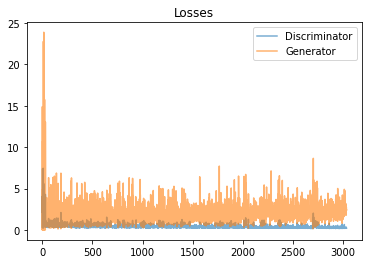

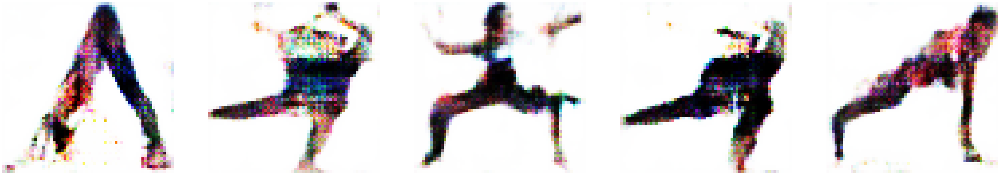

Epoch 75/100 
Duration: 172.74272 
D Loss: 0.26499 
G Loss: 2.60505


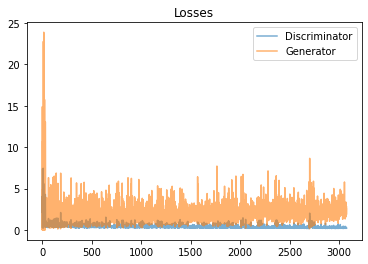

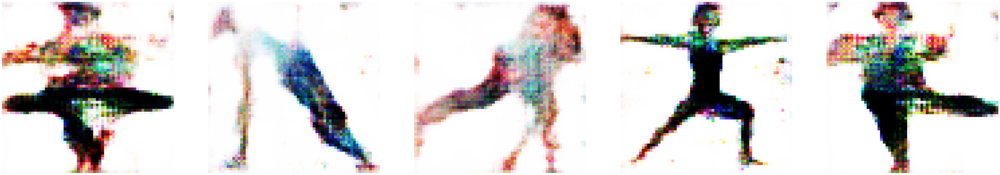

Epoch 76/100 
Duration: 173.87193 
D Loss: 0.32568 
G Loss: 2.54584


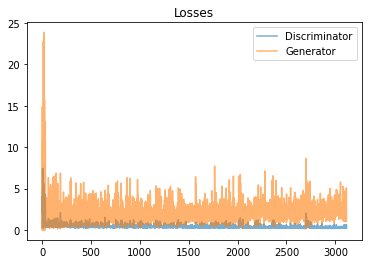

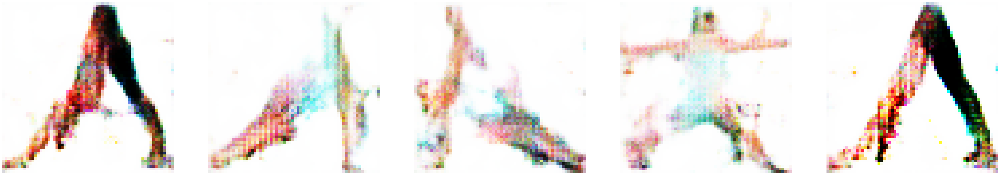

Epoch 77/100 
Duration: 170.76928 
D Loss: 0.38713 
G Loss: 2.56379


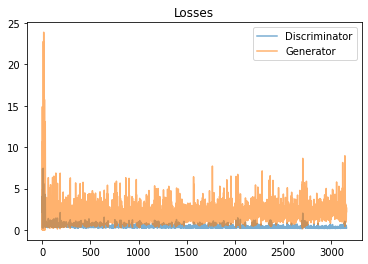

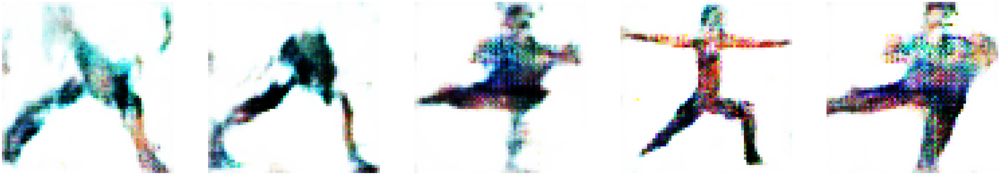

Epoch 78/100 
Duration: 172.10320 
D Loss: 0.49294 
G Loss: 2.49742


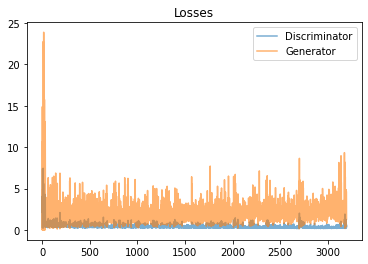

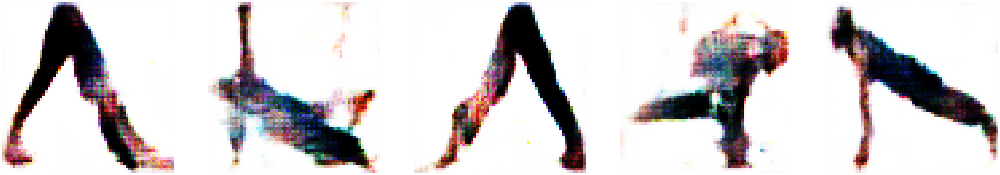

Epoch 79/100 
Duration: 173.69791 
D Loss: 0.34238 
G Loss: 2.09904


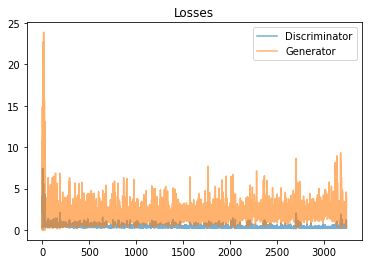

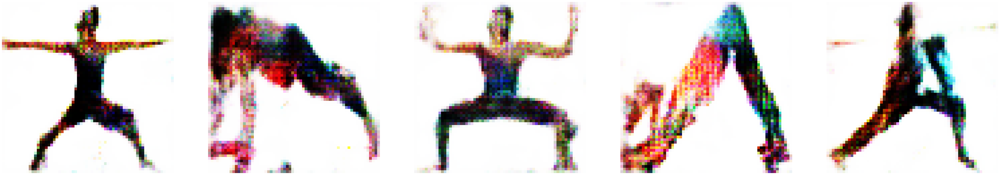

Epoch 80/100 
Duration: 173.01133 
D Loss: 0.32121 
G Loss: 2.11501


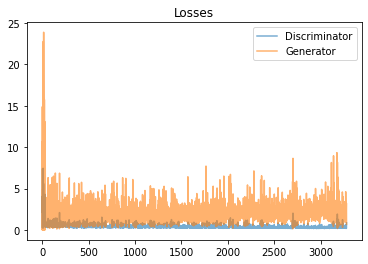

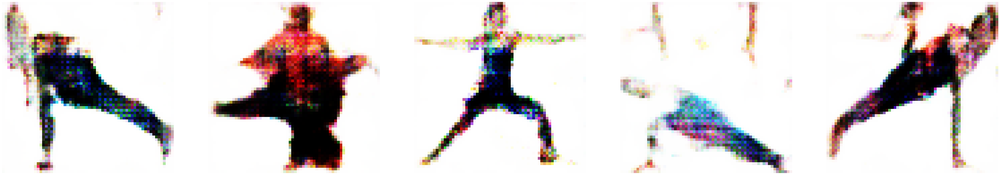

Epoch 81/100 
Duration: 179.40319 
D Loss: 0.30032 
G Loss: 2.28480


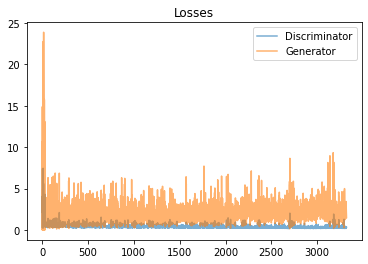

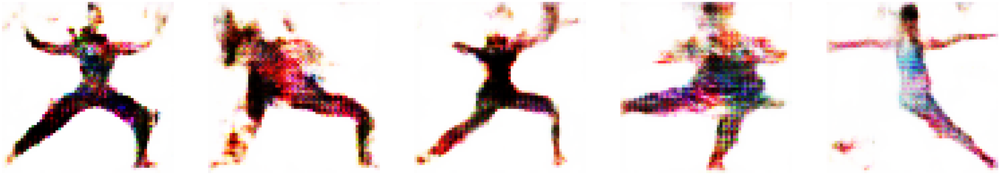

Epoch 82/100 
Duration: 178.48538 
D Loss: 0.26515 
G Loss: 2.38734


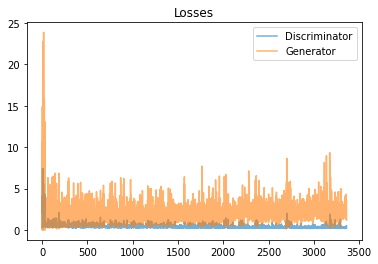

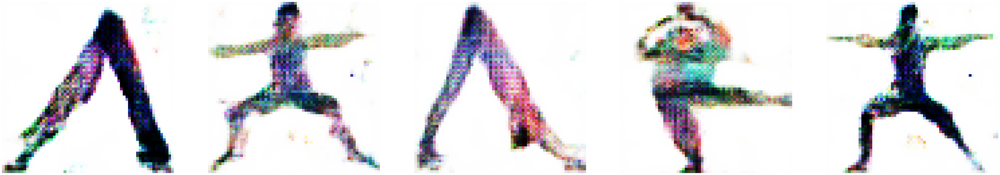

Epoch 83/100 
Duration: 178.46375 
D Loss: 0.24743 
G Loss: 2.43503


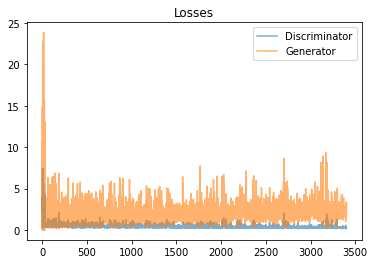

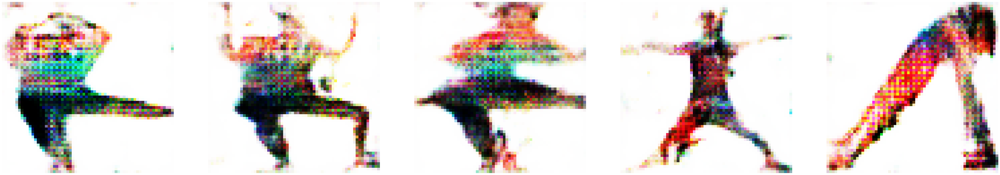

Epoch 84/100 
Duration: 175.31273 
D Loss: 0.24423 
G Loss: 2.44771


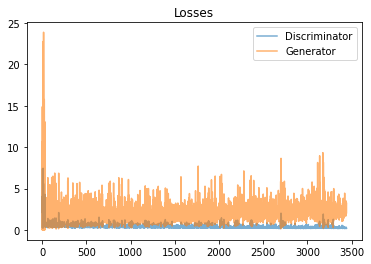

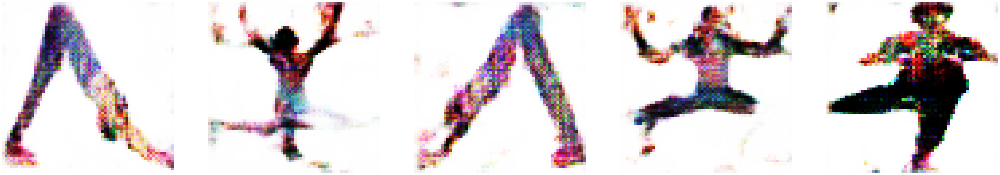

Epoch 85/100 
Duration: 179.42371 
D Loss: 0.29786 
G Loss: 2.58595


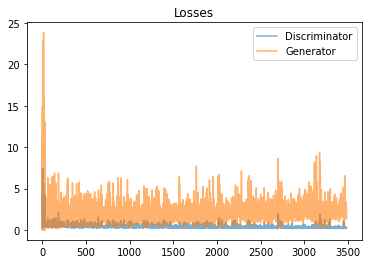

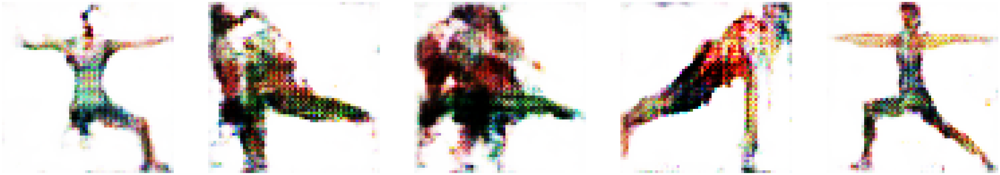

Epoch 86/100 
Duration: 176.75406 
D Loss: 0.43244 
G Loss: 2.52327


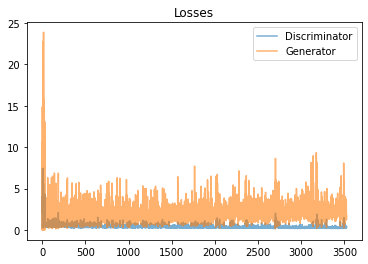

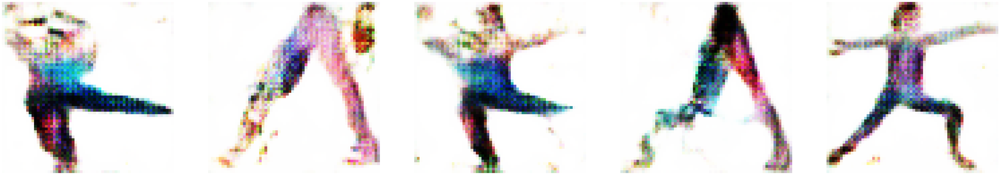

Epoch 87/100 
Duration: 182.12965 
D Loss: 0.28962 
G Loss: 2.45542


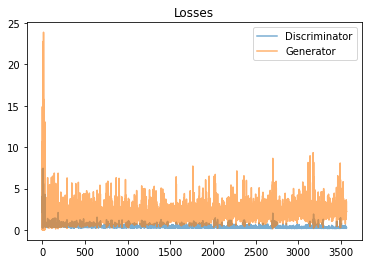

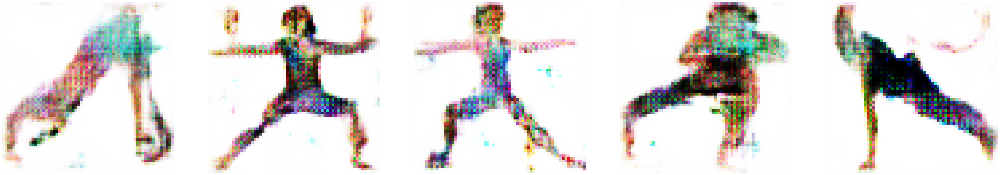

Epoch 88/100 
Duration: 183.91864 
D Loss: 0.25081 
G Loss: 2.55081


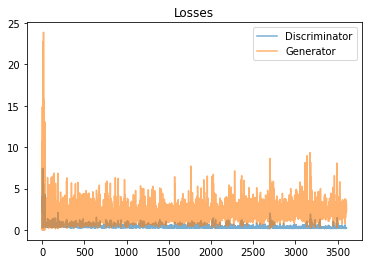

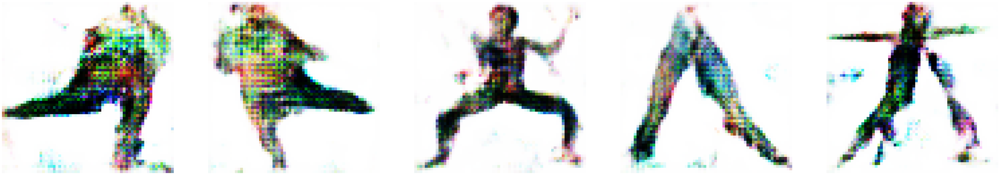

Epoch 89/100 
Duration: 178.85048 
D Loss: 0.28262 
G Loss: 2.54039


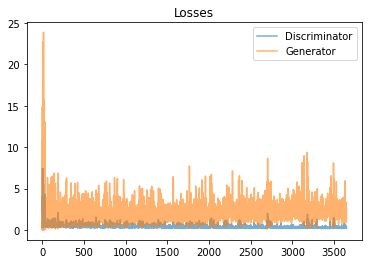

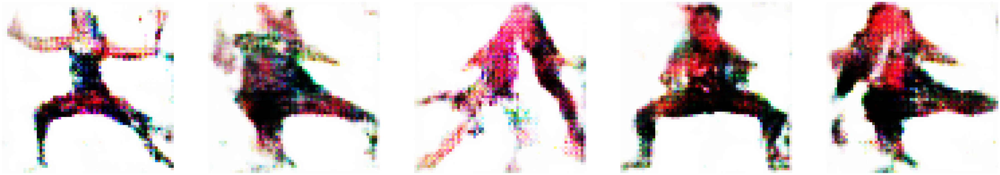

Epoch 90/100 
Duration: 173.35547 
D Loss: 0.24670 
G Loss: 2.69034


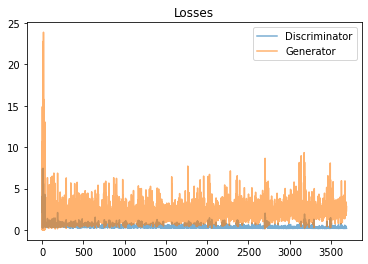

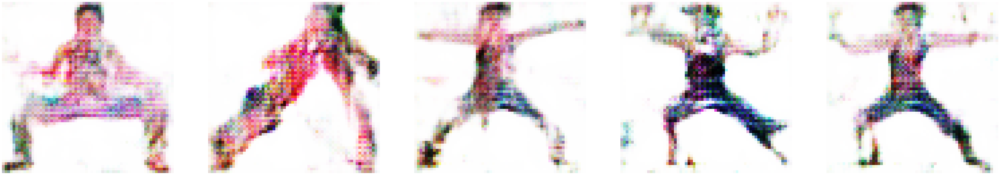

Epoch 91/100 
Duration: 172.61975 
D Loss: 0.25958 
G Loss: 2.48585


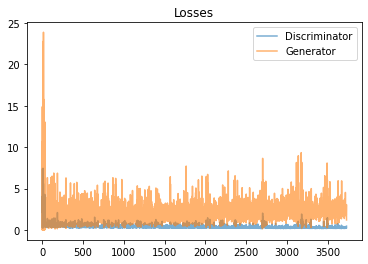

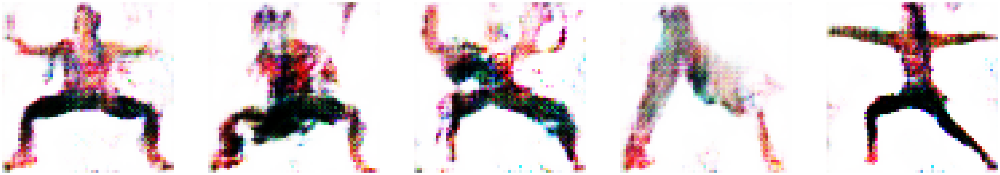

Epoch 92/100 
Duration: 173.52106 
D Loss: 0.33572 
G Loss: 2.74975


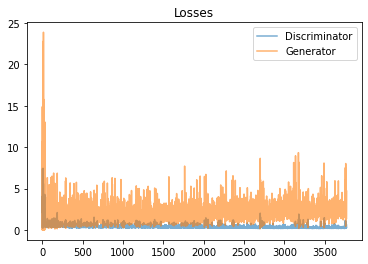

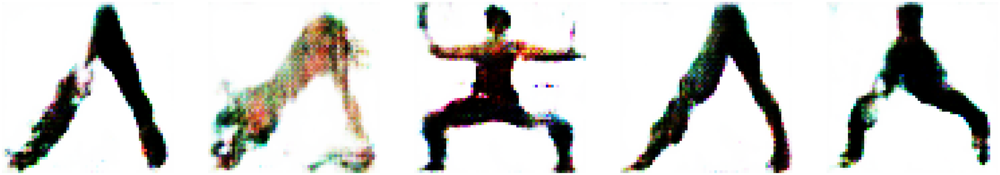

Epoch 93/100 
Duration: 179.04304 
D Loss: 0.30302 
G Loss: 2.39388


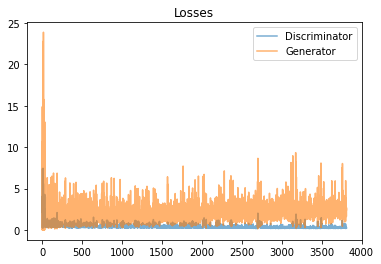

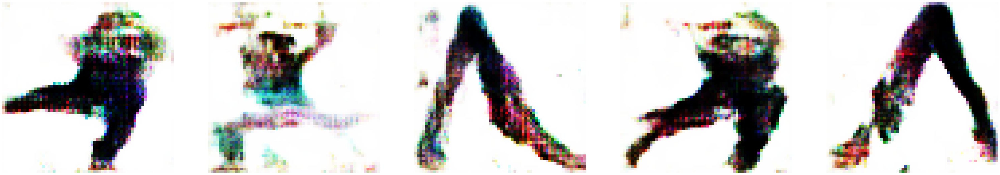

Epoch 94/100 
Duration: 177.44840 
D Loss: 0.27965 
G Loss: 2.44117


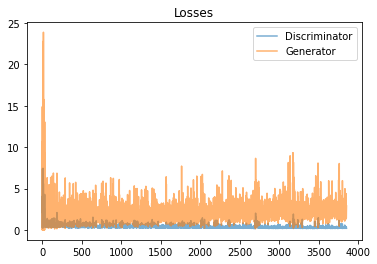

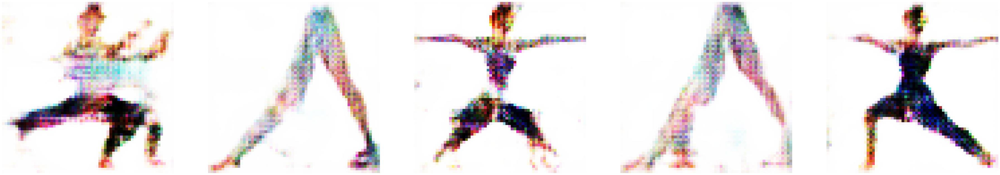

Epoch 95/100 
Duration: 178.89417 
D Loss: 0.26976 
G Loss: 2.65619


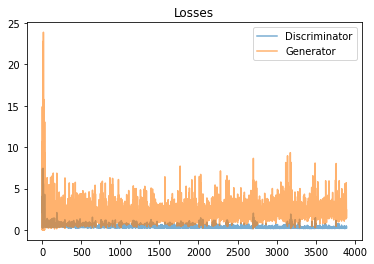

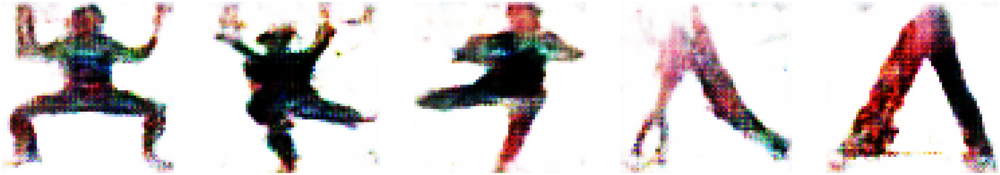

Epoch 96/100 
Duration: 180.42677 
D Loss: 0.28325 
G Loss: 2.81677


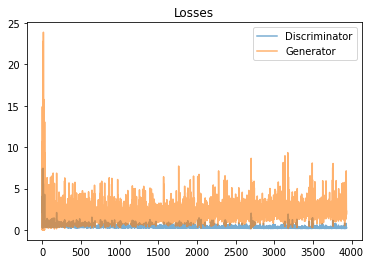

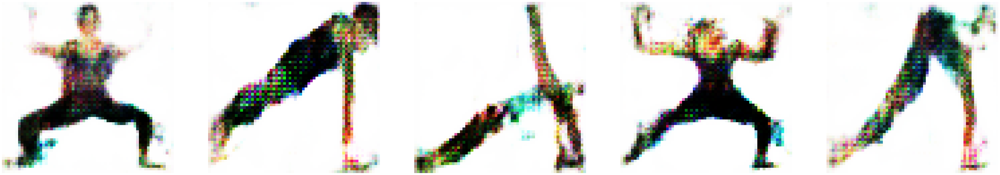

Epoch 97/100 
Duration: 179.47978 
D Loss: 0.27520 
G Loss: 2.54341


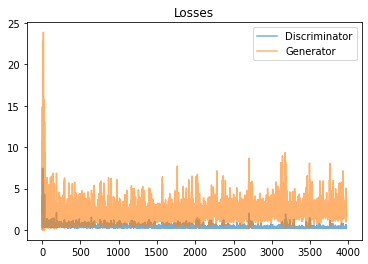

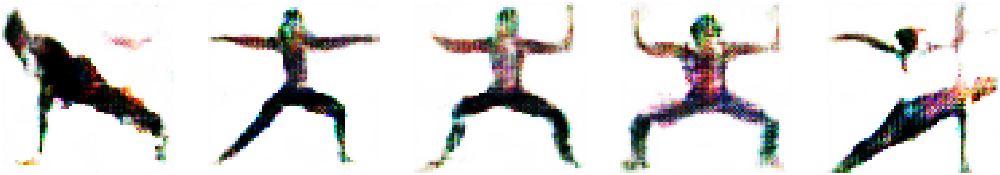

Epoch 98/100 
Duration: 183.11472 
D Loss: 0.24519 
G Loss: 2.84239


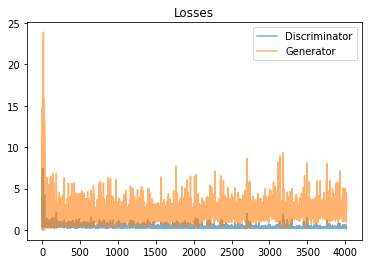

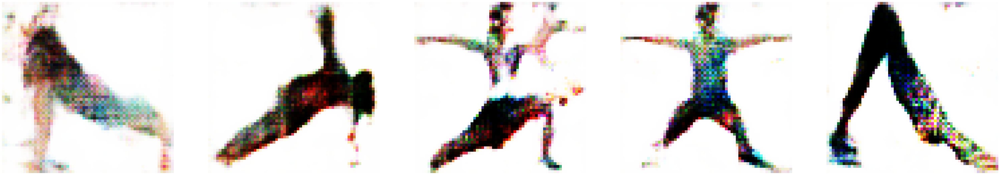

Epoch 99/100 
Duration: 180.14885 
D Loss: 0.25734 
G Loss: 2.59540


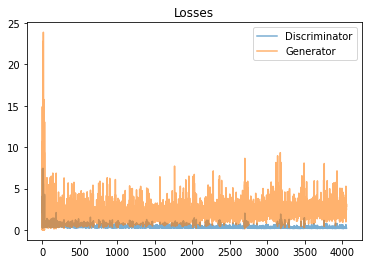

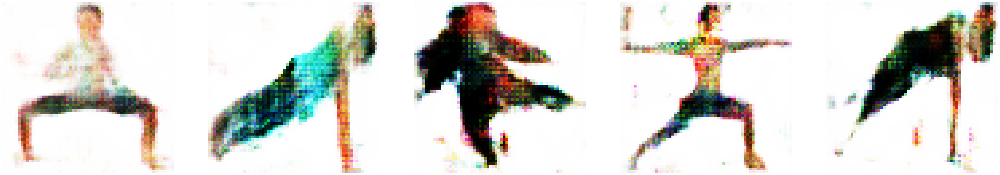

Epoch 100/100 
Duration: 177.68898 
D Loss: 0.25348 
G Loss: 2.59025


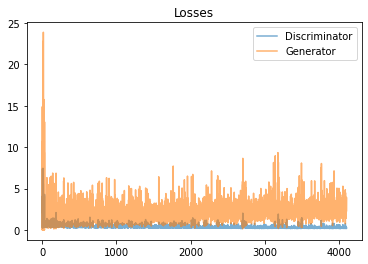

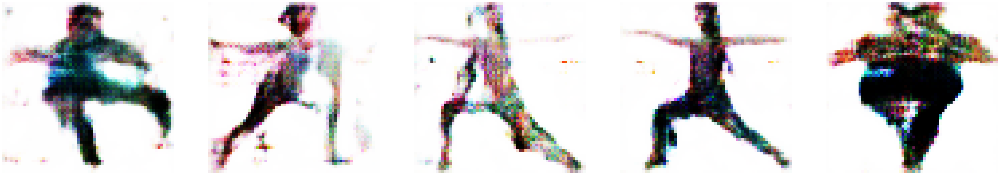

>> Generating 1k images ...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

## 4. Save generated yoga poses

In [ ]:
!zip -r ./generated-images.zip ./generated-images/

In [ ]:
from google.colab import files
files.download("/content/generated-images.zip")

In [ ]:
imgs = os.listdir('generated-images')
print ("images = ",len(imgs))

plt.figure(figsize=(10,10))
for i,image in enumerate(imgs):
    im= Image.open('generated-images/'+image)
    plt.subplot(3,3,i+1)
    plt.axis("off")
    plt.imshow(im)    
    if(i==8):
        break